# **Classifiez automatiquement des biens de consommation**



---



Ce notebook contient l'exploration du dataset , du traitementy texte image ainsi que l'etude de faisailite de classification pour les images grace a SIFT puis  CNN


# Contexte de la mission:

Vous êtes Data Scientist au sein de l’entreprise "Place de marché”, qui souhaite lancer une marketplace e-commerce


Sur la place de marché, des vendeurs proposent des articles à des acheteurs en postant une **photo et une description**.

Pour l'instant, l'attribution de la catégorie d'un article est effectuée manuellement par les vendeurs, et est donc peu fiable. De plus, le volume des articles est pour l’instant très petit.

Pour rendre l’expérience utilisateur des vendeurs (faciliter la mise en ligne de nouveaux articles) et des acheteurs (faciliter la recherche de produits) la plus fluide possible, et dans l'optique d'un passage à l'échelle, il devient nécessaire d'automatiser cette tâche.



**Travail demandé **

---






*  réaliser, dans une première itération, une étude de faisabilité d'un moteur de classification d'articles, basé sur une image et une description, pour l'automatisation de l'attribution de la catégorie de l'article.
*   analyser les descriptions textuelles et les images des produits


**Les étapes à suivre**

---






1.   Un prétraitement des données texte ou image suivant le cas
2.   Une extraction de features
2.   Une réduction en 2 dimensions, afin de projeter les produits sur un graphique 2D, sous la forme de points dont la couleur correspondra à la catégorie réelle
2.   Analyse du graphique afin d’en déduire ou pas, à l’aide des descriptions ou des images, la faisabilité de regrouper automatiquement des produits de même catégorie
2.   Réalisation d’une mesure pour confirmer ton analyse visuelle, en calculant la similarité entre les catégories réelles et les catégories issues d’une segmentation en clusters




#  1.**Chargement des librairies**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install contractions

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 289.9/289.9 kB 2.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 110.8/110.8 kB 11.7 MB/s eta 0:00:00


In [ ]:
!pip install tensorflow

In [ ]:
!pip install keras_preprocessing

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.6/42.6 kB 611.9 kB/s eta 0:00:00


In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import missingno as msg
import string
import os
from os import listdir
import re
import time


import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px



import warnings
warnings.filterwarnings("ignore")

In [ ]:
import contractions
import nltk
import io
from nltk.tokenize import RegexpTokenizer



from sklearn.manifold import TSNE
from sklearn import cluster, metrics, preprocessing
from sklearn.metrics import adjusted_rand_score, classification_report
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn import manifold, decomposition
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.datasets import make_blobs
from imutils import paths
import tensorflow_hub as hub
import keras.preprocessing.image
from tensorflow.keras.utils import img_to_array

pd.options.display.max_rows = 999
pd.options.display.max_columns = 999

nltk.download('punkt')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')



[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.


True

#  2.**EDA**

In [ ]:
path = '/content/drive/MyDrive/OC: Data Science/Datasets/Projet 6/Flipkart/'

In [ ]:
def word_count(sent):

    """
    Fonction pour calculer le nombre de mots
    """
    word2cnt = dict()
    for word in sent.split():
        if word in word2cnt: word2cnt[word] += 1
        else: word2cnt[word] = 1
    return word2cnt

In [ ]:
#chargement du dataset
data = pd.read_csv(path + 'flipkart_com-ecommerce_sample_1050 .csv')
data.head(3)

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa..."
2,64d5d4a258243731dc7bbb1eef49ad74,2016-04-30 03:22:56 +0000,http://www.flipkart.com/eurospa-cotton-terry-f...,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEG6SHXTDB2A2Y,NaN,NaN,64d5d4a258243731dc7bbb1eef49ad74.jpg,False,Key Features of Eurospa Cotton Terry Face Towe...,No rating available,No rating available,Eurospa,"{""product_specification""=>[{""key""=>""Material"",..."


In [ ]:
#shape
data.shape

(1050, 15)

In [ ]:
#valeurs manquantes
data.isnull().sum()

uniq_id                      0
crawl_timestamp              0
product_url                  0
product_name                 0
product_category_tree        0
pid                          0
retail_price                 1
discounted_price             1
image                        0
is_FK_Advantage_product      0
description                  0
product_rating               0
overall_rating               0
brand                      338
product_specifications       1
dtype: int64

<Axes: >

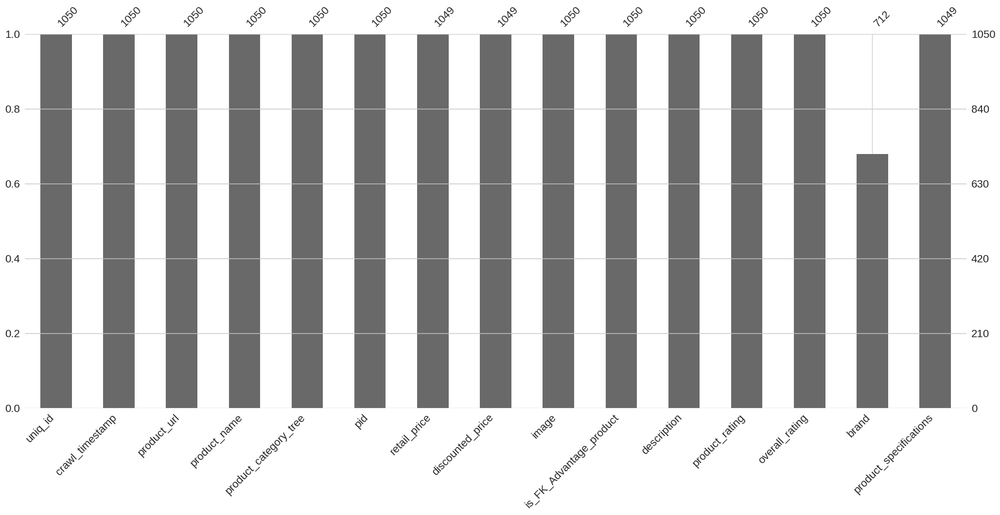

In [ ]:
msg.bar(data)

In [ ]:
#valeurs dupliquées
data.duplicated().mean()

0.0

In [ ]:
#infos dataset:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1050 entries, 0 to 1049
Data columns (total 15 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   uniq_id                  1050 non-null   object 
 1   crawl_timestamp          1050 non-null   object 
 2   product_url              1050 non-null   object 
 3   product_name             1050 non-null   object 
 4   product_category_tree    1050 non-null   object 
 5   pid                      1050 non-null   object 
 6   retail_price             1049 non-null   float64
 7   discounted_price         1049 non-null   float64
 8   image                    1050 non-null   object 
 9   is_FK_Advantage_product  1050 non-null   bool   
 10  description              1050 non-null   object 
 11  product_rating           1050 non-null   object 
 12  overall_rating           1050 non-null   object 
 13  brand                    712 non-null    object 
 14  product_specifications  

In [ ]:
data.columns

Index(['uniq_id', 'crawl_timestamp', 'product_url', 'product_name',
       'product_category_tree', 'pid', 'retail_price', 'discounted_price',
       'image', 'is_FK_Advantage_product', 'description', 'product_rating',
       'overall_rating', 'brand', 'product_specifications'],
      dtype='object')



*   **Uniq_id**




In [ ]:
data.uniq_id.duplicated().sum()

0

Nous n'avons pas de valeurs duppluqiées concernant nos ID



*   **crawl_timestamp**



In [ ]:
data.crawl_timestamp

0       2016-04-30 03:22:56 +0000
1       2016-04-30 03:22:56 +0000
2       2016-04-30 03:22:56 +0000
3       2016-06-20 08:49:52 +0000
4       2016-06-20 08:49:52 +0000
                  ...            
1045    2015-12-01 10:15:43 +0000
1046    2015-12-01 10:15:43 +0000
1047    2015-12-01 10:15:43 +0000
1048    2015-12-01 10:15:43 +0000
1049    2015-12-01 10:15:43 +0000
Name: crawl_timestamp, Length: 1050, dtype: object

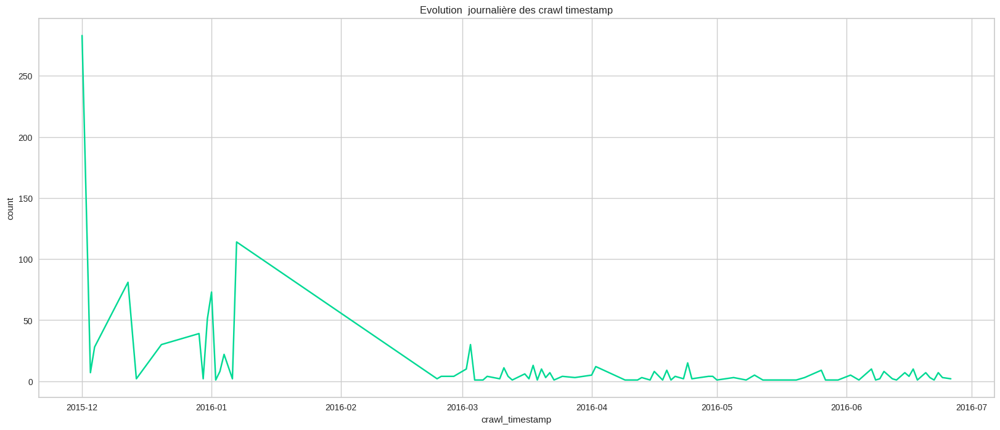

In [ ]:
df = data.groupby(data["crawl_timestamp"].astype('datetime64[ns]').dt.date).count()["uniq_id"]
fig = plt.figure(figsize=(20, 8))
ax = df.plot(color="#00d994")
ax.set_ylabel("count")
plt.title(f"Evolution  journalière des crawl timestamp")
plt.show()

In [ ]:
data['crawl_timestamp'] = data['crawl_timestamp'].astype('datetime64[ns]')

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1050 entries, 0 to 1049
Data columns (total 15 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   uniq_id                  1050 non-null   object        
 1   crawl_timestamp          1050 non-null   datetime64[ns]
 2   product_url              1050 non-null   object        
 3   product_name             1050 non-null   object        
 4   product_category_tree    1050 non-null   object        
 5   pid                      1050 non-null   object        
 6   retail_price             1049 non-null   float64       
 7   discounted_price         1049 non-null   float64       
 8   image                    1050 non-null   object        
 9   is_FK_Advantage_product  1050 non-null   bool          
 10  description              1050 non-null   object        
 11  product_rating           1050 non-null   object        
 12  overall_rating           1050 non-



*   **product_url**



In [ ]:
data.product_url

0       http://www.flipkart.com/elegance-polyester-mul...
1       http://www.flipkart.com/sathiyas-cotton-bath-t...
2       http://www.flipkart.com/eurospa-cotton-terry-f...
3       http://www.flipkart.com/santosh-royal-fashion-...
4       http://www.flipkart.com/jaipur-print-cotton-fl...
                              ...                        
1045    http://www.flipkart.com/oren-empower-extra-lar...
1046    http://www.flipkart.com/wallmantra-large-vinyl...
1047    http://www.flipkart.com/uberlyfe-extra-large-p...
1048    http://www.flipkart.com/wallmantra-medium-viny...
1049    http://www.flipkart.com/uberlyfe-large-vinyl-s...
Name: product_url, Length: 1050, dtype: object

In [ ]:
data.product_url.duplicated().sum()

0

In [ ]:
data.product_url.isnull().sum()

0

Nous n'avons pas de URL de duppliqués



*   **product_name**



In [ ]:
data.product_name

0       Elegance Polyester Multicolor Abstract Eyelet ...
1                              Sathiyas Cotton Bath Towel
2                     Eurospa Cotton Terry Face Towel Set
3       SANTOSH ROYAL FASHION Cotton Printed King size...
4       Jaipur Print Cotton Floral King sized Double B...
                              ...                        
1045       Oren Empower Extra Large Self Adhesive Sticker
1046               Wallmantra Large Vinyl Sticker Sticker
1047    Uberlyfe Extra Large Pigmented Polyvinyl Films...
1048              Wallmantra Medium Vinyl Sticker Sticker
1049                         Uberlyfe Large Vinyl Sticker
Name: product_name, Length: 1050, dtype: object

In [ ]:
data.product_name.isnull().sum()

0

In [ ]:
data.product_name.duplicated().sum()

0



*   **pid**




In [ ]:
data.pid

0       CRNEG7BKMFFYHQ8Z
1       BTWEGFZHGBXPHZUH
2       BTWEG6SHXTDB2A2Y
3       BDSEJT9UQWHDUBH4
4       BDSEJTHNGWVGWWQU
              ...       
1045    STIE88ZGTX65GH4V
1046    STIEC889ZD5GDCVQ
1047    STIE5UVGW2JWVWCT
1048    STIEC889ZGFD3RCE
1049    STIE2ZEPACRQJKH7
Name: pid, Length: 1050, dtype: object



*   **retail_price** & **discounted_price**




In [ ]:
data.retail_price.isnull().sum()

1

<Axes: xlabel='retail_price'>

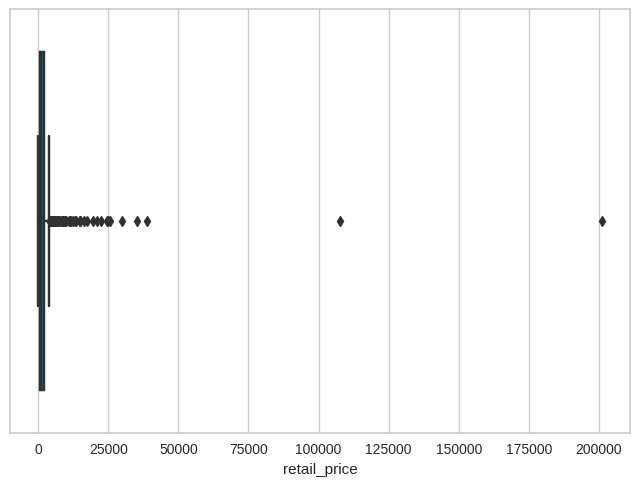

In [ ]:
sns.boxplot(data=data, x="retail_price")

<Axes: xlabel='discounted_price'>

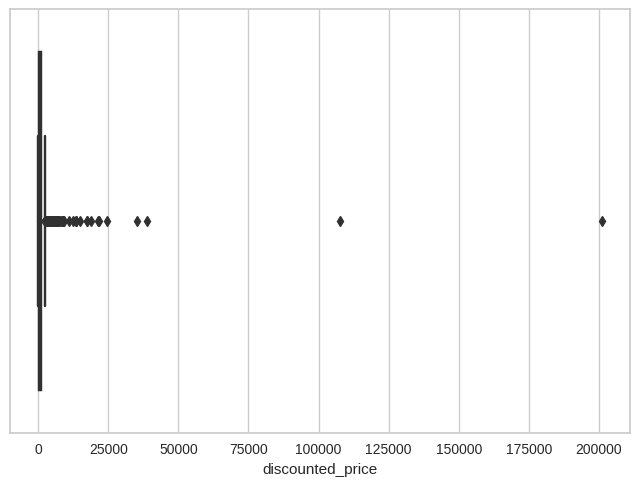

In [ ]:
sns.boxplot(data=data, x="discounted_price")



*   **image**




In [ ]:
data.image

0       55b85ea15a1536d46b7190ad6fff8ce7.jpg
1       7b72c92c2f6c40268628ec5f14c6d590.jpg
2       64d5d4a258243731dc7bbb1eef49ad74.jpg
3       d4684dcdc759dd9cdf41504698d737d8.jpg
4       6325b6870c54cd47be6ebfbffa620ec7.jpg
                        ...                 
1045    958f54f4c46b53c8a0a9b8167d9140bc.jpg
1046    fd6cbcc22efb6b761bd564c28928483c.jpg
1047    5912e037d12774bb73a2048f35a00009.jpg
1048    c3edc504d1b4f0ba6224fa53a43a7ad6.jpg
1049    f2f027ad6a6df617c9f125173da71e44.jpg
Name: image, Length: 1050, dtype: object

In [ ]:
data.image.duplicated().sum()

0

Nous n'avons qu'un path par image

In [ ]:
data.columns

Index(['uniq_id', 'crawl_timestamp', 'product_url', 'product_name',
       'product_category_tree', 'pid', 'retail_price', 'discounted_price',
       'image', 'is_FK_Advantage_product', 'description', 'product_rating',
       'overall_rating', 'brand', 'product_specifications'],
      dtype='object')


*   **product_rating** & **overall_rating**







In [ ]:
data.product_rating.unique()

array(['No rating available', '5', '1', '2.3', '2.7', '4.5', '4', '3.8',
       '4.3', '3.7', '3.6', '3.5', '4.1', '4.9', '3.1', '4.2', '4.8',
       '4.4', '3.9', '3', '3.3', '2.5', '2', '4.7', '2.2', '3.2', '1.5'],
      dtype=object)

In [ ]:
data.product_rating.nunique()

27

In [ ]:
data.overall_rating.unique()

array(['No rating available', '5', '1', '2.3', '2.7', '4.5', '4', '3.8',
       '4.3', '3.7', '3.6', '3.5', '4.1', '4.9', '3.1', '4.2', '4.8',
       '4.4', '3.9', '3', '3.3', '2.5', '2', '4.7', '2.2', '3.2', '1.5'],
      dtype=object)

In [ ]:
data.overall_rating.nunique()

27

In [ ]:
pie_pr = data[data["product_rating"].isin(data["product_rating"].value_counts(ascending=False).index[:10])]
print(pie_pr["product_rating"].value_counts().reset_index())
px.pie(pie_pr["product_rating"].value_counts().reset_index(),
      values = pie_pr["product_rating"].value_counts().reset_index()["product_rating"],
      names = pie_pr["product_rating"].value_counts().index,
      hole=0.3)

                 index  product_rating
0  No rating available             889
1                    5              43
2                    4              21
3                    3              12
4                    1              10
5                  4.5              10
6                  4.3               9
7                  3.7               8
8                  3.5               8
9                    2               6


In [ ]:
pie_pr["product_rating"].value_counts().reset_index()

,index,product_rating
0,No rating available,889
1,5,43
2,4,21
3,3,12
4,1,10
5,4.5,10
6,4.3,9
7,3.7,8
8,3.5,8
9,2,6


In [ ]:
pie_pr["product_rating"].value_counts().reset_index()["product_rating"]/pie_pr["product_rating"].value_counts().sum()*100

0    87.500000
1     4.232283
2     2.066929
3     1.181102
4     0.984252
5     0.984252
6     0.885827
7     0.787402
8     0.787402
9     0.590551
Name: product_rating, dtype: float64

84% de nos individus sont sans evaluations

In [ ]:
pie_or = data[data["overall_rating"].isin(data["overall_rating"].value_counts(ascending=False).index[:10])]
print(pie_or["overall_rating"].value_counts().reset_index())
px.pie(pie_or["overall_rating"].value_counts().reset_index(),
      values = pie_or["overall_rating"].value_counts().reset_index()["overall_rating"],
      names = pie_or["overall_rating"].value_counts().index,
      hole=0.3)

                 index  overall_rating
0  No rating available             889
1                    5              43
2                    4              21
3                    3              12
4                    1              10
5                  4.5              10
6                  4.3               9
7                  3.7               8
8                  3.5               8
9                    2               6


In [ ]:
pie_or["overall_rating"].value_counts().reset_index()["overall_rating"]\
                  /pie_pr["overall_rating"].value_counts().sum()*100

0    87.500000
1     4.232283
2     2.066929
3     1.181102
4     0.984252
5     0.984252
6     0.885827
7     0.787402
8     0.787402
9     0.590551
Name: overall_rating, dtype: float64

84% de nos individus sont sans evaluation.

ces deux colonnes :


*   product_rating
*   overall_rating

ne nous donnent plus d'informations , et ne sont pas utiles pour notre etude.



*   **brand**




In [ ]:
data.brand.duplicated().sum()

559

In [ ]:
data.brand.nunique()

490

In [ ]:
data['brand'][0]

'Elegance'



*   **product_specifications**




In [ ]:
data.product_specifications.duplicated().sum()

65

In [ ]:
data.product_specifications.nunique()

984

In [ ]:
data['product_specifications'][0]

'{"product_specification"=>[{"key"=>"Brand", "value"=>"Elegance"}, {"key"=>"Designed For", "value"=>"Door"}, {"key"=>"Type", "value"=>"Eyelet"}, {"key"=>"Model Name", "value"=>"Abstract Polyester Door Curtain Set Of 2"}, {"key"=>"Model ID", "value"=>"Duster25"}, {"key"=>"Color", "value"=>"Multicolor"}, {"key"=>"Length", "value"=>"213 cm"}, {"key"=>"Number of Contents in Sales Package", "value"=>"Pack of 2"}, {"key"=>"Sales Package", "value"=>"2 Curtains"}, {"key"=>"Material", "value"=>"Polyester"}]}'



*   **description**




In [ ]:
data.description

0       Key Features of Elegance Polyester Multicolor ...
1       Specifications of Sathiyas Cotton Bath Towel (...
2       Key Features of Eurospa Cotton Terry Face Towe...
3       Key Features of SANTOSH ROYAL FASHION Cotton P...
4       Key Features of Jaipur Print Cotton Floral Kin...
                              ...                        
1045    Oren Empower Extra Large Self Adhesive Sticker...
1046    Wallmantra Large Vinyl Sticker Sticker (Pack o...
1047    Buy Uberlyfe Extra Large Pigmented Polyvinyl F...
1048    Buy Wallmantra Medium Vinyl Sticker Sticker fo...
1049    Buy Uberlyfe Large Vinyl Sticker for Rs.595 on...
Name: description, Length: 1050, dtype: object

In [ ]:
data['description'][0]

'Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant curtain that softly filters light in your room so that you

Nous remarquons que nous retrouvons les valeurs dans les colones 'brands' et products specifications' dans 'description'. Pas besoin alors de traiter toutes ces colones. On peut se limiter a description. D'autant plus, que nous n'avons pas de valeurs manquantes dans description.

## 2.1 Préparation des données

In [ ]:
# Définition des fonctions de similarité : ARI score , graphique TSNE

#ARI score
def ARI_fct(features) :
   """ Calcul Tsne, détermination des clusters et calcul ARI entre
   vrais catégorie et n° de clusters"""
    time1 = time.time()
    num_labels=len(data.cat_niveau_1.unique())
    tsne = manifold.TSNE(n_components=2, perplexity=30, n_iter=2000,
                                 init='random', learning_rate=200, random_state=42)
    X_tsne = tsne.fit_transform(features)

    # Détermination des clusters à partir des données après Tsne
    cls = cluster.KMeans(n_clusters=num_labels, n_init=100, random_state=42)
    cls.fit(X_tsne)
    ARI = np.round(metrics.adjusted_rand_score(y_cat_num, cls.labels_),4)
    time2 = np.round(time.time() - time1,0)
    print("ARI : ", ARI, "time : ", time2)

    return ARI, X_tsne, cls.labels_


#TSNE graphe
def TSNE_visu_fct(X_tsne, y_cat_num, labels, ARI) :
    """ visualisation du Tsne selon les vraies catégories et selon les clusters
    """
    fig = plt.figure(figsize=(15,6))

    ax = fig.add_subplot(121)
    scatter = ax.scatter(X_tsne[:,0],X_tsne[:,1], c= "Set2", cmap='Set1')
    ax.legend(handles=scatter.legend_elements()[0], labels=data.cat_niveau_1.unique(), loc="best", title="Categorie")
    plt.title('Représentation des mots par catégories réelles')

    ax = fig.add_subplot(122)
    scatter = ax.scatter(X_tsne[:,0],X_tsne[:,1], c=labels, cmap='Set1')
    ax.legend(handles=scatter.legend_elements()[0], labels=set(labels), loc="best", title="Clusters")
    plt.title('Représentation des mots par clusters')

    plt.show()
    print("ARI : ", ARI)

## 1.1Traitement des categories

In [ ]:
#on affiche la colonne "product_category_tree"
pd.set_option('display.max_colwidth', 300)
data[['product_category_tree']]

,product_category_tree
0,"[""Home Furnishing >> Curtains & Accessories >> Curtains >> Elegance Polyester Multicolor Abstract Eyelet Do...""]"
1,"[""Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Sathiyas Baby Bath Towels >> Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Y...""]"
2,"[""Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Eurospa Baby Bath Towels >> Eurospa Cotton Terry Face Towel Set (20 PIECE FA...""]"
3,"[""Home Furnishing >> Bed Linen >> Bedsheets >> SANTOSH ROYAL FASHION Bedsheets >> SANTOSH ROYAL FASHION Cotton Printed King sized ...""]"
4,"[""Home Furnishing >> Bed Linen >> Bedsheets >> Jaipur Print Bedsheets >> Jaipur Print Cotton Floral King sized Double Bed...""]"
...,...
1045,"[""Baby Care >> Baby & Kids Gifts >> Stickers >> Oren Empower Stickers""]"
1046,"[""Baby Care >> Baby & Kids Gifts >> Stickers >> Wallmantra Stickers""]"
1047,"[""Baby Care >> Baby & Kids Gifts >> Stickers >> Uberlyfe Stickers""]"
1048,"[""Baby Care >> Baby & Kids Gifts >> Stickers >> Wallmantra Stickers""]"


Nous remarquons que les lignes ont un pattern :  texte >> texte >> texte >> .... Nous allons alors définir une fonction

```
# split_categories
```

qui va nous permettre de separer les texte et les >> regroupant ainsi les categories selon des niveaux (1, 2 et 3à)

In [ ]:
#Traitement des catégories
def split_categories(category, level):
    '''FOnction qui affiche les '''
    category = category.split('["')[1].split('"]')[0]
    cat = category.split(' >> ')
    if(len(cat)) < 3:
        cat = [cat[0], cat[1], 'None']
        if(len(cat))<2:
            cat = [cat[0], 'None', 'None']
    return cat[level]

def split_categories_1(category):
    return split_categories(category,0)
def split_categories_2(category):
    return split_categories(category,1)
def split_categories_3(category):
    return split_categories(category,2)

def detail_categories(dataframe):
    dataframe['cat_niveau_1'] = dataframe['product_category_tree'].apply(split_categories_1)
    dataframe['cat_niveau_2'] = dataframe['product_category_tree'].apply(split_categories_2)
    dataframe['cat_niveau_3'] = dataframe['product_category_tree'].apply(split_categories_3)
    return dataframe.drop(['product_category_tree'], axis=1)


In [ ]:
data = detail_categories(data)

In [ ]:
data.shape

(1050, 17)

In [ ]:
data.columns

Index(['uniq_id', 'crawl_timestamp', 'product_url', 'product_name', 'pid',
       'retail_price', 'discounted_price', 'image', 'is_FK_Advantage_product',
       'description', 'product_rating', 'overall_rating', 'brand',
       'product_specifications', 'cat_niveau_1', 'cat_niveau_2',
       'cat_niveau_3'],
      dtype='object')

Nous rematrquons que nous sommes passé d'un dataset a 15 colonnes à 17 colonnes. Sachant qu'avec notre fonction (detail_categories) , nous supprimons notre colonne initiale ['product_category_tree']. nous avons ainsi 3 nouvelles colonnes:

In [ ]:
print('cat_niveau_1 : ', data['cat_niveau_1'].unique().size)
print('cat_niveau_2 : ',  data['cat_niveau_2'].unique().size)
print('cat_niveau_3 : ',  data['cat_niveau_3'].unique().size)


cat_niveau_1 :  7
cat_niveau_2 :  62
cat_niveau_3 :  242


In [ ]:
data.groupby('cat_niveau_1').count()['uniq_id'].sort_values(ascending=False)

cat_niveau_1
Baby Care                     150
Beauty and Personal Care      150
Computers                     150
Home Decor & Festive Needs    150
Home Furnishing               150
Kitchen & Dining              150
Watches                       150
Name: uniq_id, dtype: int64

Nous avons 150 individus par categorie.

In [ ]:
pie_cat1 = data[data["cat_niveau_1"].isin(data["cat_niveau_1"].value_counts(ascending=False).index[:30])]
print(pie_cat1["cat_niveau_1"].value_counts().reset_index())
px.pie(pie_cat1["cat_niveau_1"].value_counts().reset_index(),
      values = pie_cat1["cat_niveau_1"].value_counts().reset_index()["cat_niveau_1"],
      names = pie_cat1["cat_niveau_1"].value_counts().index,
      hole=0.3)

                        index  cat_niveau_1
0             Home Furnishing           150
1                   Baby Care           150
2                     Watches           150
3  Home Decor & Festive Needs           150
4            Kitchen & Dining           150
5    Beauty and Personal Care           150
6                   Computers           150


Nous avons alors 7 categories principales avec 150 valeurs dans chacune

In [ ]:
data.groupby('cat_niveau_2').count()['uniq_id'].sort_values(ascending=False)

cat_niveau_2
Wrist Watches                      149
Laptop Accessories                  87
Infant Wear                         84
Coffee Mugs                         74
Showpieces                          71
Bed Linen                           65
Fragrances                          65
Network Components                  49
Cookware                            27
Table Decor & Handicrafts           27
Combos and Kits                     24
Wall Decor & Clocks                 22
Bath Linen                          21
Curtains & Accessories              19
Makeup                              18
Baby & Kids Gifts                   15
Body and Skin Care                  15
Baby Bedding                        15
Baby Bath & Skin                    14
Decorative Lighting & Lamps         14
Kitchen Tools                       14
Kitchen & Dining Linen              14
Containers & Bottles                13
Cushions, Pillows & Covers          13
Hair Care                            9
Feeding & Nu

Nous avons 62 sous categories

In [ ]:
pie_cat2 = data[data["cat_niveau_2"].isin(data["cat_niveau_2"].value_counts(ascending=False).index[:30])]
print(pie_cat2["cat_niveau_2"].value_counts().reset_index())
px.pie(pie_cat2["cat_niveau_2"].value_counts().reset_index(),
      values = pie_cat2["cat_niveau_2"].value_counts().reset_index()["cat_niveau_2"],
      names = pie_cat2["cat_niveau_2"].value_counts().index,
      hole=0.3)

                          index  cat_niveau_2
0                 Wrist Watches           149
1            Laptop Accessories            87
2                   Infant Wear            84
3                   Coffee Mugs            74
4                    Showpieces            71
5                     Bed Linen            65
6                    Fragrances            65
7            Network Components            49
8                      Cookware            27
9     Table Decor & Handicrafts            27
10              Combos and Kits            24
11          Wall Decor & Clocks            22
12                   Bath Linen            21
13       Curtains & Accessories            19
14                       Makeup            18
15           Body and Skin Care            15
16                 Baby Bedding            15
17            Baby & Kids Gifts            15
18       Kitchen & Dining Linen            14
19             Baby Bath & Skin            14
20  Decorative Lighting & Lamps   

In [ ]:
data.groupby('cat_niveau_3').count()['uniq_id'].sort_values(ascending=False)

cat_niveau_3
Deodorants                                             65
Blankets, Quilts & Dohars                              57
Baby Girls' Clothes                                    49
Routers                                                49
USB Gadgets                                            38
Baby Boys' Clothes                                     35
Ethnic                                                 34
Prithish Coffee Mugs                                   26
Pots & Pans                                            24
Maxima Wrist Watches                                   23
Showpieces                                             23
Rockmantra Coffee Mugs                                 22
Batteries                                              22
Sonata Wrist Watches                                   19
Curtains                                               19
Towels                                                 19
Printland Coffee Mugs                                  13
K

Nous avons 242 sous sous categories

In [ ]:
pie_cat3 = data[data["cat_niveau_3"].isin(data["cat_niveau_3"].value_counts(ascending=False).index[:30])]
print(pie_cat3["cat_niveau_3"].value_counts().reset_index())
px.pie(pie_cat3["cat_niveau_3"].value_counts().reset_index(),
      values = pie_cat3["cat_niveau_3"].value_counts().reset_index()["cat_niveau_3"],
      names = pie_cat3["cat_niveau_3"].value_counts().index,
      hole=0.3)

                          index  cat_niveau_3
0                    Deodorants            65
1     Blankets, Quilts & Dohars            57
2           Baby Girls' Clothes            49
3                       Routers            49
4                   USB Gadgets            38
5            Baby Boys' Clothes            35
6                        Ethnic            34
7          Prithish Coffee Mugs            26
8                   Pots & Pans            24
9                    Showpieces            23
10         Maxima Wrist Watches            23
11       Rockmantra Coffee Mugs            22
12                    Batteries            22
13         Sonata Wrist Watches            19
14                       Towels            19
15                     Curtains            19
16        Printland Coffee Mugs            13
17           Kitchen Implements            12
18               Cushion Covers            12
19             Baby Bath Towels            11
20  Computer Accessories Combos   

On definit nos clusters

In [ ]:
data['cat_niveau_1'].unique()

array(['Home Furnishing', 'Baby Care', 'Watches',
       'Home Decor & Festive Needs', 'Kitchen & Dining',
       'Beauty and Personal Care', 'Computers'], dtype=object)

In [ ]:
data['Cluster_cat']=''

def assign_cluster(df):

  df.loc[df.eval("cat_niveau_1==  'Home Furnishing'"), "Cluster_cat"]           = 0
  df.loc[df.eval("cat_niveau_1 == 'Baby Care'"), "Cluster_cat"]                 = 1
  df.loc[df.eval("cat_niveau_1 == 'Watches'"), "Cluster_cat"]                   = 2
  df.loc[df.eval("cat_niveau_1 == 'Home Decor & Festive Needs'"), "Cluster_cat"] = 3
  df.loc[df.eval("cat_niveau_1 == 'Kitchen & Dining'"), "Cluster_cat"]           = 4
  df.loc[df.eval("cat_niveau_1 == 'Beauty and Personal Care'"), "Cluster_cat"]  = 5
  df.loc[df.eval("cat_niveau_1 == 'Computers'"), "Cluster_cat"]                 = 6

  return df

assign_cluster(data)

,uniq_id,crawl_timestamp,product_url,product_name,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications,cat_niveau_1,cat_niveau_2,cat_niveau_3,Cluster_cat
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56,http://www.flipkart.com/elegance-polyester-multicolor-abstract-eyelet-door-curtain/p/itmeg7bkzdgthcts?pid=CRNEG7BKMFFYHQ8Z,Elegance Polyester Multicolor Abstract Eyelet Door Curtain,CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,"Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester ...",No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""value""=>""Elegance""}, {""key""=>""Designed For"", ""value""=>""Door""}, {""key""=>""Type"", ""value""=>""Eyelet""}, {""key""=>""Model Name"", ""value""=>""Abstract Polyester Door Curtain Set Of 2""}, {""key""=>""Model ID"", ""value""=>""Duster25""}, {""key""=>""Color"", ""value""=>""Multico...",Home Furnishing,Curtains & Accessories,Curtains,0
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56,http://www.flipkart.com/sathiyas-cotton-bath-towel/p/itmegfzhxbyucwgn?pid=BTWEGFZHGBXPHZUH,Sathiyas Cotton Bath Towel,BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,"Specifications of Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Yellow, Blue) Bath Towel Features Machine Washable Yes Material Cotton Design Self Design General Brand Sathiyas Type Bath Towel GSM 500 Model Name Sathiyas cotton bath towel Ideal For Men, Women, Boys, Girls Model ID asvtwl322 Col...",No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Washable"", ""value""=>""Yes""}, {""key""=>""Material"", ""value""=>""Cotton""}, {""key""=>""Design"", ""value""=>""Self Design""}, {""key""=>""Brand"", ""value""=>""Sathiyas""}, {""key""=>""Type"", ""value""=>""Bath Towel""}, {""key""=>""GSM"", ""value""=>""500""}, {""key""=>""Model Name"", ""value""=...",Baby Care,Baby Bath & Skin,Baby Bath Towels,1
2,64d5d4a258243731dc7bbb1eef49ad74,2016-04-30 03:22:56,http://www.flipkart.com/eurospa-cotton-terry-face-towel-set/p/itmeg6shbrpubhca?pid=BTWEG6SHXTDB2A2Y,Eurospa Cotton Terry Face Towel Set,BTWEG6SHXTDB2A2Y,NaN,NaN,64d5d4a258243731dc7bbb1eef49ad74.jpg,False,"Key Features of Eurospa Cotton Terry Face Towel Set Size: small Height: 9 inch GSM: 360,Eurospa Cotton Terry Face Towel Set (20 PIECE FACE TOWEL SET, Assorted) Price: Rs. 299 Eurospa brings to you an exclusively designed, 100% soft cotton towels of export quality. All our products have soft text...",No rating available,No rating available,Eurospa,"{""product_specification""=>[{""key""=>""Material"", ""value""=>""Cotton Terry""}, {""key""=>""Design"", ""value""=>""SHUVAM""}, {""key""=>""Brand"", ""value""=>""Eurospa""}, {""key""=>""GSM"", ""value""=>""360""}, {""key""=>""Type"", ""value""=>""Face Towel Set""}, {""key""=>""Model Name"", ""value""=>""SHUVAM20PCFTSETASSORTED""}, {""key""=>""Ide...",Baby Care,Baby Bath & Skin,Baby Bath Towels,1
3,d4684dcdc759dd9cdf41504698d737d8,2016-06-20 08:49:52,http://www.flipkart.com/santosh-royal-fashion-cotton-printed-king-sized-double-bedsheet/p/itmejt9uaqahahuf?pid=BDSEJT9UQWHDUBH4,SANTOSH ROYAL FASHION Cotton Printed King sized Double Bedsheet,BDSEJT9UQWHDUBH4,2699.0,1299.0,d4684dcdc759dd9cdf41504698d737d8.jpg,False,"Key Features of SANTOSH ROYAL FASHION Cotton Printed King sized Double Bedsheet Royal Bedsheet Perfact for Wedding & Gifting,Specifications of SANTOSH ROYAL FASHION Cotton Printed King sized Double Bedsheet (1 Bedsheet,2 Pillow Cover, Multicolor) General Brand SANTOSH ROYAL FASHION Machine Washa...",No rating available,No rating available,SANTOSH ROYAL FASHION,"{""pro

In [ ]:
pie_cat11 = data[data['Cluster_cat'].isin(data['Cluster_cat'].value_counts(ascending=False).index[:30])]
print(pie_cat11['Cluster_cat'].value_counts().reset_index())
px.pie(pie_cat11['Cluster_cat'].value_counts().reset_index(),
      values = pie_cat11['Cluster_cat'].value_counts().reset_index()['Cluster_cat'],
      names = pie_cat11['Cluster_cat'].value_counts().index,
      hole=0.3)

   index  Cluster_cat
0      0          150
1      1          150
2      2          150
3      3          150
4      4          150
5      5          150
6      6          150


In [ ]:
data.groupby("Cluster_cat").agg({"uniq_id" : "count"}).reset_index()

,Cluster_cat,uniq_id
0,0,150
1,1,150
2,2,150
3,3,150
4,4,150
5,5,150
6,6,150


#  3.**Pretraitement des données Texte**

**Nous maintenons la categorisation niveau 1. Nous y avons 150 elements pour les 7 categories ce qui est hgomogene pour notre etudes. nous avons 242 et 272 pour les autres niveau ce qui represente beaucoup de feature et donc pas interessant pour notre etude**

Afin de réaliser la mission demandée, nous devons nettoyer le texte , en l'occurance la colonne ["description"]. Plusieurs etapes sont a effectuer pour retirer le surplus.
Une fois le texte est en miniscule, sans ponctuations, nous allons pouvoir faire de la tokenization. Ensuite comparer la lemmatisation et le stemming.

## 3.1 Traitement

### Lower

In [ ]:
#Lower

data["cleaned_description"] = data["description"].apply(lambda x: x.lower())
data.description.head(3)

0    Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester ...
1    Specifications of Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Yellow, Blue) Bath Towel Features Machine Washable Yes Material Cotton Design Self Design General Brand Sathiyas Type Bath Towel GSM 500 Model Name Sathiyas cotton bath towel Ideal For Men, Women, Boys, Girls Model ID asvtwl322 Col...
2    Key Features of Eurospa Cotton Terry Face Towel Set Size: small Height: 9 inch GSM: 360,Eurospa Cotton Terry Face Towel Set (20 PIECE FACE TOWEL SET, Assorted) Price: Rs. 299 Eurospa brings to you an exclusively designed, 100% soft cotton towels of export quality. All our products have soft text...
Name: description, dtype: object

In [ ]:
print(len(data["description"][0]))
print("avant:\n", data["description"][0])
print(len(data["cleaned_description"][0]))
print("apres:\n",data["cleaned_description"][0])

1420
avant:
 Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant curtain that softly filters light in your room

### Contractions

In [ ]:
%time
import contractions

CPU times: user 4 µs, sys: 1 µs, total: 5 µs
Wall time: 9.06 µs


In [ ]:
# Test
test_text = """
            I'd like to know how I'd done that!
            We're going to the zoo and I don't think I'll be home for dinner
            Theyre going to the zoo and she'll be home for dinner

            """
print("Test: ", contractions.fix(test_text))

Test:  
            I would like to know how I would done that!
            We are going to the zoo and I do not think I will be home for dinner
            They Are going to the zoo and she will be home for dinner

            


In [ ]:
data["cleaned_description"] = data["cleaned_description"].apply(lambda x: contractions.fix(x))

#test
print(len(data["description"][0]))
print("avant:\n", data["description"][0])
print(len(data["cleaned_description"][0]))
print("apres:\n",data["cleaned_description"][0])

1420
avant:
 Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant curtain that softly filters light in your room

### Noise Removal


In [ ]:
def remove_URL(text):
    """
        Remove URLs from a sample string
    """
    return re.sub(r"https?://\S+|www\.\S+", "", text)

In [ ]:
# remove urls from the text
data["cleaned_description"] = data["cleaned_description"].apply(lambda x: remove_URL(x))

# test
print(len(data["description"][0]))
print("avant:\n", data["description"][0])
print(len(data["cleaned_description"][0]))
print("apres:\n",data["cleaned_description"][0])

1420
avant:
 Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant curtain that softly filters light in your room

### Remove HTML tags

In [ ]:
def remove_html(text):
    """
        Remove the html in sample text
    """
    html = re.compile(r"<.*?>|&([a-z0-9]+|#[0-9]{1,6}|#x[0-9a-f]{1,6});")
    return re.sub(html, "", text)

In [ ]:
# remove html from the text
data["cleaned_description"] = data["cleaned_description"].apply(lambda x: remove_html(x))

# test
print(len(data["description"][0]))
print("avant:\n", data["description"][0])
print(len(data["cleaned_description"][0]))
print("apres:\n",data["cleaned_description"][0])

1420
avant:
 Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant curtain that softly filters light in your room

### Remove Non-ASCI

In [ ]:
def remove_non_ascii(text):
    """
        Remove non-ASCII characters
    """
    return re.sub(r'[^\x00-\x7f]',r'', text) # or ''.join([x for x in text if x in string.printable])

In [ ]:
# remove non-ascii characters from the text
data["cleaned_description"] = data["cleaned_description"].apply(lambda x: remove_non_ascii(x))

# double check
print(len(data["description"][0]))
print("avant:\n", data["description"][0])
print(len(data["cleaned_description"][0]))
print("apres:\n",data["cleaned_description"][0])

1420
avant:
 Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant curtain that softly filters light in your room

### punctuations

In [ ]:
def remove_punct(text):
    """
        Remove the punctuation
    """
#     return re.sub(r'[]!"$%&\'()*+,./:;=#@?[\\^_`{|}~-]+', "", text)
    return text.translate(str.maketrans('', '', string.punctuation))

In [ ]:
# remove punctuations from the text
data["cleaned_description"] = data["cleaned_description"].apply(lambda x: remove_punct(x))

# double check
print(len(data["description"][0]))
print("avant:\n", data["description"][0])
print(len(data["cleaned_description"][0]))
print("apres:\n",data["cleaned_description"][0])

1420
avant:
 Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant curtain that softly filters light in your room

## 3.2 Preprocessing

### Tokenization

Tokenization is used in natural language processing to split paragraphs and sentences into smaller units that can be more easily assigned meaning

In [ ]:
# Tokenizing the description

data['tokenized'] = data.apply(lambda x : w_tokenizer.tokenize(x['lemmatizer']), axis = 1)
data.head(2)

,uniq_id,crawl_timestamp,product_url,product_name,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications,cat_niveau_1,cat_niveau_2,cat_niveau_3,Cluster_cat,cleaned_description,lemmatizer,tokenized
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56,http://www.flipkart.com/elegance-polyester-multicolor-abstract-eyelet-door-curtain/p/itmeg7bkzdgthcts?pid=CRNEG7BKMFFYHQ8Z,Elegance Polyester Multicolor Abstract Eyelet Door Curtain,CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,"Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester ...",No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""value""=>""Elegance""}, {""key""=>""Designed For"", ""value""=>""Door""}, {""key""=>""Type"", ""value""=>""Eyelet""}, {""key""=>""Model Name"", ""value""=>""Abstract Polyester Door Curtain Set Of 2""}, {""key""=>""Model ID"", ""value""=>""Duster25""}, {""key""=>""Color"", ""value""=>""Multico...",Home Furnishing,Curtains & Accessories,Curtains,0,key features of elegance polyester multicolor abstract eyelet door curtain floral curtainelegance polyester multicolor abstract eyelet door curtain 213 cm in height pack of 2 price rs 899 this curtain enhances the look of the interiorsthis curtain is made from 100 high quality polyester fabricit...,key feature elegance polyester multicolor abstract eyelet door curtain floral curtainelegance polyester multicolor abstract eyelet door curtain height pack price curtain enhances look interiorsthis curtain make high quality polyester fabricit feature eyelet style stitch metal ringit make room en...,"[key, feature, elegance, polyester, multicolor, abstract, eyelet, door, curtain, floral, curtainelegance, polyester, multicolor, abstract, eyelet, door, curtain, height, pack, price, curtain, enhances, look, interiorsthis, curtain, make, high, quality, polyester, fabricit, feature, eyelet, style..."
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56,http://www.flipkart.com/sathiyas-cotton-bath-towel/p/itmegfzhxbyucwgn?pid=BTWEGFZHGBXPHZUH,Sathiyas Cotton Bath Towel,BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,"Specifications of Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Yellow, Blue) Bath Towel Features Machine Washable Yes Material Cotton Design Self Design General Brand Sathiyas Type Bath Towel GSM 500 Model Name Sathiyas cotton bath towel Ideal For Men, Women, Boys, Girls Model ID asvtwl322 Col...",No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Washable"", ""value""=>""Yes""}, {""key""=>""Material"", ""value""=>""Cotton""}, {""key""=>""Design"", ""value""=>""Self Design""}, {""key""=>""Brand"", ""value""=>""Sathiyas""}, {""key""=>""Type"", ""value""=>""Bath Towel""}, {""key""=>""GSM"", ""value""=>""500""}, {""key""=>""Model Name"", ""value""=...",Baby Care,Baby Bath & Skin,Baby Bath Towels,1,specifications of sathiyas cotton bath towel 3 bath towel red yellow blue bath towel features machine washable yes material cotton design self design general brand sathiyas type bath towel gsm 500 model name sathiyas cotton bath towel ideal for men women boys girls model id asvtwl322 color red y...,specification sathiyas cotton bath towel bath towel red yellow blue bath towel feature machine washable yes material cotton design self design general brand sathiyas type bath towel gsm model name sathiyas cotton bath towel ideal men woman boy girl model asvtwl color red yellow blue size mediam ...,"[specification, sathiyas, cotton, bath, towel, bath, towel, red, yellow, blue, bath, towel, feature, machine, washable, yes, material, cotton, design, self, d

In [ ]:
len(data['tokenized'])

1050

In [ ]:
data['tokenized'].values[0]

['key',
 'feature',
 'elegance',
 'polyester',
 'multicolor',
 'abstract',
 'eyelet',
 'door',
 'curtain',
 'floral',
 'curtainelegance',
 'polyester',
 'multicolor',
 'abstract',
 'eyelet',
 'door',
 'curtain',
 'height',
 'pack',
 'price',
 'curtain',
 'enhances',
 'look',
 'interiorsthis',
 'curtain',
 'make',
 'high',
 'quality',
 'polyester',
 'fabricit',
 'feature',
 'eyelet',
 'style',
 'stitch',
 'metal',
 'ringit',
 'make',
 'room',
 'environment',
 'romantic',
 'lovingthis',
 'curtain',
 'ant',
 'wrinkle',
 'anti',
 'shrinkage',
 'elegant',
 'apparancegive',
 'home',
 'bright',
 'modernistic',
 'appeal',
 'design',
 'surreal',
 'attention',
 'sure',
 'steal',
 'heart',
 'contemporary',
 'eyelet',
 'valance',
 'curtain',
 'slide',
 'smoothly',
 'draw',
 'apart',
 'first',
 'thing',
 'morning',
 'welcome',
 'bright',
 'sun',
 'ray',
 'want',
 'wish',
 'good',
 'morning',
 'whole',
 'world',
 'draw',
 'close',
 'even',
 'create',
 'special',
 'moment',
 'joyous',
 'beauty',
 'gi

In [ ]:
data.shape

(1050, 21)

### Lemmatization & stopwords

la lemmatisation est Opération consistant à regrouper les formes occurrentes d'un texte ou d'une liste sous des adresses lexicales

On va pouvoir le faire grace à WordNetLemmatizer (Lemmatize using WordNet's built-in morphy functionReturns the input word unchanged if it cannot be found in WordNet)

In [ ]:
import re
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [ ]:
from nltk.corpus import stopwords, wordnet

In [ ]:
def get_wordnet_pos(word):
    """Map POS tag to first character lemmatize() accepts"""
    tag = nltk.pos_tag([word])[0][1][0].upper()
    tag_dict = {"J": wordnet.ADJ,
                "N": wordnet.NOUN,
                "V": wordnet.VERB,
                "R": wordnet.ADV}

    return tag_dict.get(tag, wordnet.NOUN)

In [ ]:
from nltk.stem import WordNetLemmatizer
lemmatizer = WordNetLemmatizer()
wnl = nltk.stem.WordNetLemmatizer()
w_tokenizer = nltk.RegexpTokenizer(r'[a-zA-Z]\w+\'?\w*')

stopwords = set(stopwords.words("english"))

def preprocess(sentence):
    sentence=str(sentence)
    sentence = sentence.lower()
    sentence=sentence.replace('{html}',"")
    cleanr = re.compile('<.*?>')
    cleantext = re.sub(cleanr, '', sentence)
    rem_url=re.sub(r'http\S+', '',cleantext)
    rem_num = re.sub('[0-9]+', '', rem_url)
    tokenizer = RegexpTokenizer(r'[a-zA-Z]\w+\'?\w*')
    tokens = tokenizer.tokenize(rem_num)
    filtered_words = [w for w in tokens if len(w) > 2 if not w in stopwords]
    lemma_words=[wnl.lemmatize(w, get_wordnet_pos(w)) for w in filtered_words]
    return " ".join(lemma_words)

In [ ]:
data['lemmatizer'] = data['cleaned_description'].apply(preprocess)

In [ ]:
print("Avant:")
print(data['description'][0])
print(len(data['description'][0]))
print()
print("Après Lemmatisation:")
print(data['lemmatizer'][0])
print(len(data['lemmatizer'][0]))

Avant:
Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant curtain that softly filters light in your room so th

### Stemming


Le stemming désigne généralement le processus heuristique brut qui consiste à découper la fin des mots dans afin de ne conserver que la racine du mot.

Nous avons plusieurs facons d'appliquer le stemming.
Nous utilisons pour notre etude PorterStemming

In [ ]:
from nltk.stem import snowball

In [ ]:
from nltk.stem import PorterStemmer

In [ ]:
# stemmer = PorterStemmer()
stemmer = PorterStemmer()

def preprocess_stem(sentence):
    sentence=str(sentence)
    sentence = sentence.lower()
    sentence=sentence.replace('{html}',"")
    cleanr = re.compile('<.*?>')
    cleantext = re.sub(cleanr, '', sentence)
    rem_url=re.sub(r'http\S+', '',cleantext)
    rem_num = re.sub('[0-9]+', '', rem_url)
    tokenizer = RegexpTokenizer(r'[a-zA-Z]\w+\'?\w*')
    tokens = tokenizer.tokenize(rem_num)
    filtered_words = [w for w in tokens if len(w) > 2 if not w in stopwords]
    stem_words=[stemmer.stem(w) for w in filtered_words]
    return " ".join(stem_words)

In [ ]:
%time
data['stemmer'] = data['description'].apply(preprocess_stem)

data['tokenize_stem'] = data.apply(lambda x : w_tokenizer.tokenize(x['stemmer']), axis = 1)
data.head()

CPU times: user 4 µs, sys: 0 ns, total: 4 µs
Wall time: 8.82 µs


,uniq_id,crawl_timestamp,product_url,product_name,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications,cat_niveau_1,cat_niveau_2,cat_niveau_3,Cluster_cat,cleaned_description,lemmatizer,tokenized,stemmer,tokenize_stem
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56,http://www.flipkart.com/elegance-polyester-multicolor-abstract-eyelet-door-curtain/p/itmeg7bkzdgthcts?pid=CRNEG7BKMFFYHQ8Z,Elegance Polyester Multicolor Abstract Eyelet Door Curtain,CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,"Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester ...",No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""value""=>""Elegance""}, {""key""=>""Designed For"", ""value""=>""Door""}, {""key""=>""Type"", ""value""=>""Eyelet""}, {""key""=>""Model Name"", ""value""=>""Abstract Polyester Door Curtain Set Of 2""}, {""key""=>""Model ID"", ""value""=>""Duster25""}, {""key""=>""Color"", ""value""=>""Multico...",Home Furnishing,Curtains & Accessories,Curtains,0,key features of elegance polyester multicolor abstract eyelet door curtain floral curtainelegance polyester multicolor abstract eyelet door curtain 213 cm in height pack of 2 price rs 899 this curtain enhances the look of the interiorsthis curtain is made from 100 high quality polyester fabricit...,key feature elegance polyester multicolor abstract eyelet door curtain floral curtainelegance polyester multicolor abstract eyelet door curtain height pack price curtain enhances look interiorsthis curtain make high quality polyester fabricit feature eyelet style stitch metal ringit make room en...,"[key, feature, elegance, polyester, multicolor, abstract, eyelet, door, curtain, floral, curtainelegance, polyester, multicolor, abstract, eyelet, door, curtain, height, pack, price, curtain, enhances, look, interiorsthis, curtain, make, high, quality, polyester, fabricit, feature, eyelet, style...",key featur eleg polyest multicolor abstract eyelet door curtain floral curtain eleg polyest multicolor abstract eyelet door curtain height pack price curtain enhanc look interior curtain made high qualiti polyest fabric featur eyelet style stitch metal ring make room environ romant love curtain ...,"[key, featur, eleg, polyest, multicolor, abstract, eyelet, door, curtain, floral, curtain, eleg, polyest, multicolor, abstract, eyelet, door, curtain, height, pack, price, curtain, enhanc, look, interior, curtain, made, high, qualiti, polyest, fabric, featur, eyelet, style, stitch, metal, ring, ..."
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56,http://www.flipkart.com/sathiyas-cotton-bath-towel/p/itmegfzhxbyucwgn?pid=BTWEGFZHGBXPHZUH,Sathiyas Cotton Bath Towel,BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,"Specifications of Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Yellow, Blue) Bath Towel Features Machine Washable Yes Material Cotton Design Self Design General Brand Sathiyas Type Bath Towel GSM 500 Model Name Sathiyas cotton bath towel Ideal For Men, Women, Boys, Girls Model ID asvtwl322 Col...",No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Washable"", ""value""=>""Yes""}, {""key""=>""Material"", ""value""=>""Cotton""}, {""key""=>""Design"", ""value""=>""Self Design""}, {""key""=>""Brand"", ""value""=>""Sathiyas""}, {""key""=>""Type"", ""value""=>""Bath Towel""}, {""key""=>""GSM"", ""value""=>""500""}, {""key""=>""Model Name"", ""value""=...",Baby Care,Baby Bath & Skin,Baby Bath Towels,1,specifications of sathiyas cotton bath towel 3 bath towel red yellow blue bath towel features machine washable yes material cotton desi

In [ ]:
data.shape

(1050, 23)

In [ ]:
data['tokenize_stem'][0]

['key',
 'featur',
 'eleg',
 'polyest',
 'multicolor',
 'abstract',
 'eyelet',
 'door',
 'curtain',
 'floral',
 'curtain',
 'eleg',
 'polyest',
 'multicolor',
 'abstract',
 'eyelet',
 'door',
 'curtain',
 'height',
 'pack',
 'price',
 'curtain',
 'enhanc',
 'look',
 'interior',
 'curtain',
 'made',
 'high',
 'qualiti',
 'polyest',
 'fabric',
 'featur',
 'eyelet',
 'style',
 'stitch',
 'metal',
 'ring',
 'make',
 'room',
 'environ',
 'romant',
 'love',
 'curtain',
 'ant',
 'wrinkl',
 'anti',
 'shrinkag',
 'eleg',
 'appar',
 'give',
 'home',
 'bright',
 'modernist',
 'appeal',
 'design',
 'surreal',
 'attent',
 'sure',
 'steal',
 'heart',
 'contemporari',
 'eyelet',
 'valanc',
 'curtain',
 'slide',
 'smoothli',
 'draw',
 'apart',
 'first',
 'thing',
 'morn',
 'welcom',
 'bright',
 'sun',
 'ray',
 'want',
 'wish',
 'good',
 'morn',
 'whole',
 'world',
 'draw',
 'close',
 'even',
 'creat',
 'special',
 'moment',
 'joyou',
 'beauti',
 'given',
 'sooth',
 'print',
 'bring',
 'home',
 'eleg',

In [ ]:
len(data['tokenize_stem'][0])

147

In [ ]:
len(data['lemmatizer'][0])

1058

In [ ]:
len(data['stemmer'][0])

964

In [ ]:
text_total = []
for i in range(len(data['tokenized'])) :
  text_total += data['tokenized'].values[i]
print('Le nombre de mots de la colonne tokenize         ==>', len(text_total))
print('Le nombre de mots uniques de la colonne tokenized ==>', len(set(text_total)))

Le nombre de mots de la colonne tokenize         ==> 52256
Le nombre de mots uniques de la colonne tokenized ==> 4776


In [ ]:
text_total = []
for i in range(len(data['tokenize_stem'])) :
  text_total += data['tokenize_stem'].values[i]
print('Le nombre de mots de la colonne tokenize_stem         ==>', len(text_total))
print('Le nombre de mots uniques de la colonne tokenize_stem ==>', len(set(text_total)))

Le nombre de mots de la colonne tokenize_stem         ==> 53554
Le nombre de mots uniques de la colonne tokenize_stem ==> 4011


In [ ]:
text_total = []
for i in range(len(data['lemmatizer'])) :
  text_total += data['lemmatizer'].values[i]
print('Le nombre de mots de la colonne lemmatizer         ==>', len(text_total))
print('Le nombre de mots uniques de la colonne lemmatizer ==>', len(set(text_total)))

Le nombre de mots de la colonne lemmatizer         ==> 362321
Le nombre de mots uniques de la colonne lemmatizer ==> 27


In [ ]:
datatext_total = []
for i in range(len(data['stemmer'])) :
  text_total += data['stemmer'].values[i]
print('Le nombre de mots de la colonne stemmer         ==>', len(text_total))
print('Le nombre de mots uniques de la colonne stemmer ==>', len(set(text_total)))

Le nombre de mots de la colonne stemmer         ==> 695908
Le nombre de mots uniques de la colonne stemmer ==> 30


Nous avons meilleur resultats avec la lemmatisation qu'avec le stemming

La suite de la classification du Texte (notebook2)

#  4.**Pretraitement des données Images**

## 4.1 Préparation des données

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
#train, test = train_test_split(data.sample(200, random_state=42), test_size = 0.25, random_state=42)
train, test = train_test_split(data, test_size = 0.25, random_state=42)
#del data

In [ ]:
print('train:', train.shape)
print('test:' ,  test.shape)

train: (787, 23)
test: (263, 23)


In [ ]:
train.to_csv(path + 'train_set.csv', index = False)

In [ ]:
test.to_csv(path + 'test_set.csv', index = False)

In [ ]:
train.head(2)

,uniq_id,crawl_timestamp,product_url,product_name,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications,cat_niveau_1,cat_niveau_2,cat_niveau_3,Cluster_cat,cleaned_description,lemmatizer,tokenized,stemmer,tokenize_stem
165,785b4383b12106dd172306d427d8f7b2,2015-12-01 12:40:44,http://www.flipkart.com/rockmantra-cute-two-cats-ceramic-mug/p/itmeaggkyugvunnv?pid=MUGEAGGKFBTYPN4Z,Rockmantra Cute Two Cats Ceramic Mug,MUGEAGGKFBTYPN4Z,499.0,349.0,785b4383b12106dd172306d427d8f7b2.jpg,False,"Rockmantra Cute Two Cats Ceramic Mug (5.5 l)\r\n Price: Rs. 349\r\n\t\t\t\t\r\n\t\t\tGive a thrilling yet fresh start to your day. An exclusive creation by Rockmantra, this mug features porcelain crafting ensuring the design stays permanent for years to come and making it...",No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Type"", ""value""=>""Mug""}, {""key""=>""Mug Capacity"", ""value""=>""5.5 l""}, {""key""=>""Freezer Safe"", ""value""=>""Yes""}, {""key""=>""Material"", ""value""=>""Ceramic""}, {""key""=>""Microwave Safe"", ""value""=>""Yes""}, {""value""=>""1 Year Rockmantra Brand Warranty and Free Transit Insuran...",Kitchen & Dining,Coffee Mugs,Rockmantra Coffee Mugs,4,rockmantra cute two cats ceramic mug 55 l\r\n price rs 349\r\n\t\t\t\t\r\n\t\t\tgive a thrilling yet fresh start to your day an exclusive creation by rockmantra this mug features porcelain crafting ensuring the design stays permanent for years to come and making it a perf...,rockmantra cute two cat ceramic mug price give thrill yet fresh start day exclusive creation rockmantra mug feature porcelain craft ensure design stay permanent year come make perfect pick gift love one toodishwasher microwave safe product detail specification material ceramic size give thrill y...,"[rockmantra, cute, two, cat, ceramic, mug, price, give, thrill, yet, fresh, start, day, exclusive, creation, rockmantra, mug, feature, porcelain, craft, ensure, design, stay, permanent, year, come, make, perfect, pick, gift, love, one, toodishwasher, microwave, safe, product, detail, specificati...",rockmantra cute two cat ceram mug price give thrill yet fresh start day exclus creation rockmantra mug featur porcelain craft ensur design stay perman year come make perfect pick gift love one dishwash microwav safe product detail specif materi ceram size give thrill yet fresh start day exclus c...,"[rockmantra, cute, two, cat, ceram, mug, price, give, thrill, yet, fresh, start, day, exclus, creation, rockmantra, mug, featur, porcelain, craft, ensur, design, stay, perman, year, come, make, perfect, pick, gift, love, one, dishwash, microwav, safe, product, detail, specif, materi, ceram, size..."
248,45d0af2c709de47268c80c35a117de44,2015-12-01 12:40:44,http://www.flipkart.com/malhar-niko-male-doll-showpiece-25-cm/p/itmey382drsj8cbj?pid=SHIEY382SR75SXEY,Malhar Niko Male Doll Showpiece - 25 cm,SHIEY382SR75SXEY,6395.0,5436.0,45d0af2c709de47268c80c35a117de44.jpg,True,Buy Malhar Niko Male Doll Showpiece - 25 cm for Rs.5436 online. Malhar Niko Male Doll Showpiece - 25 cm at best prices with FREE shipping & cash on delivery. Only Genuine Products. 30 Day Replacement Guarantee.,No rating available,No rating available,Malhar,"{""product_specification""=>[{""key""=>""Brand"", ""value""=>""Malhar""}, {""key""=>""Model Number"", ""value""=>""A039""}, {""key""=>""Type"", ""value""=>""Ethnic""}, {""key""=>""Material"", ""value""=>""Iron""}, {""key""=>""Model Name"", ""value""=>""Niko Male Doll""}, {""key""=>""Purpose"", ""value""=>""Show Piece""}, {""key""=>""Color"", ""value...",Home Decor & Festive Needs,Showpieces,Malhar Showpieces,3,buy malhar niko male doll showpiece 25 cm for rs5436 online malhar niko male doll showpiece 25 cm at best prices with free shipping cash on delivery only genuine products 30 day replacement guarantee,buy malhar niko male doll showpiece online malhar niko male doll showpiece best price 

## 4.2 Lecture des images

In [ ]:
def load_image_in_dict(repertoire):
    # Chargement des images pré-traitées dans un dictionnaire d'images
    images = {}
    for filename in os.listdir(repertoire):
        path = repertoire + "/" + filename
        img = cv.imread(path, 0)
        images[filename] = img
    return images

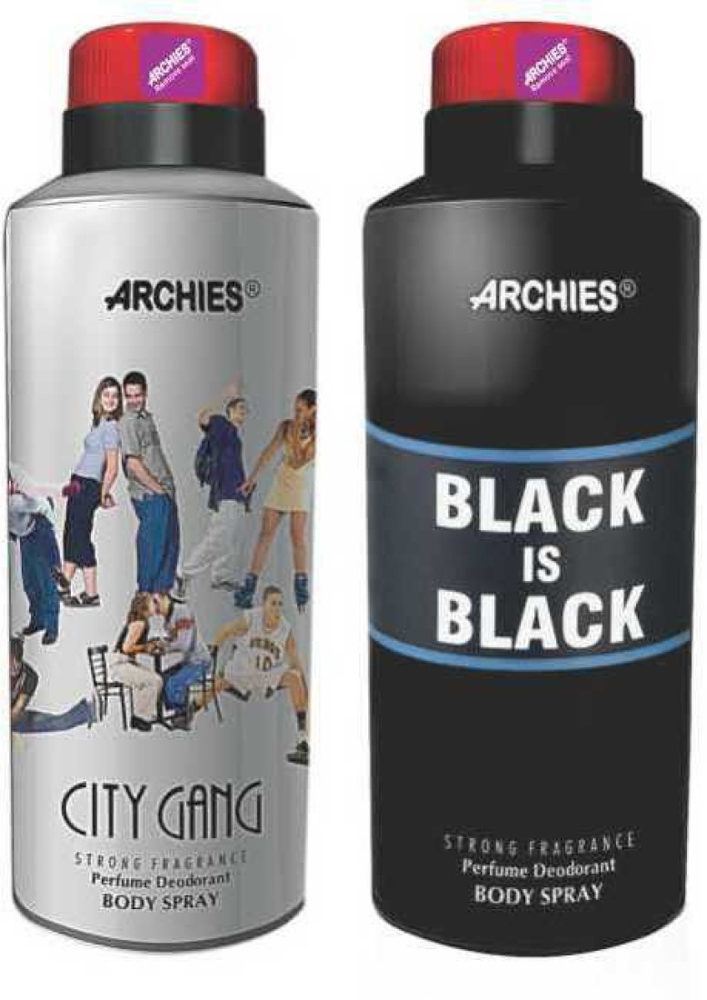

In [ ]:
from IPython.display import Image
Image('/content/drive/MyDrive/OC: Data Science/Datasets/Projet 6/Flipkart/Images/'+ str(data.sample(1)['image'].values.tolist()[0]), width=400 )

In [ ]:
img_echantillon = data.sample(50, random_state=10)

In [ ]:
img_echantillon['image'] = img_echantillon['image'].apply(lambda x: '/content/drive/MyDrive/OC: Data Science/Datasets/Projet 6/Flipkart/Images/'+str(x))

In [ ]:
img_echantillon['image'].head(3)

775    /content/drive/MyDrive/OC: Data Science/Datasets/Projet 6/Flipkart/Images/93618b8a998782d4d847ee5cba5c7de2.jpg
806    /content/drive/MyDrive/OC: Data Science/Datasets/Projet 6/Flipkart/Images/9c06a95a82c3bd6635b9fe6e92b15902.jpg
694    /content/drive/MyDrive/OC: Data Science/Datasets/Projet 6/Flipkart/Images/0ae859a69c7608d8197c3ba8c37bc6ec.jpg
Name: image, dtype: object

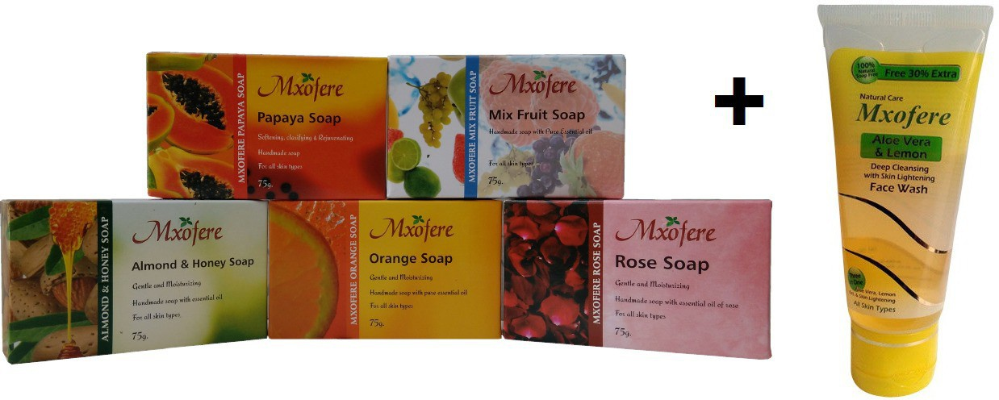

In [ ]:
Image(img_echantillon.iloc[1]['image'], width=150)

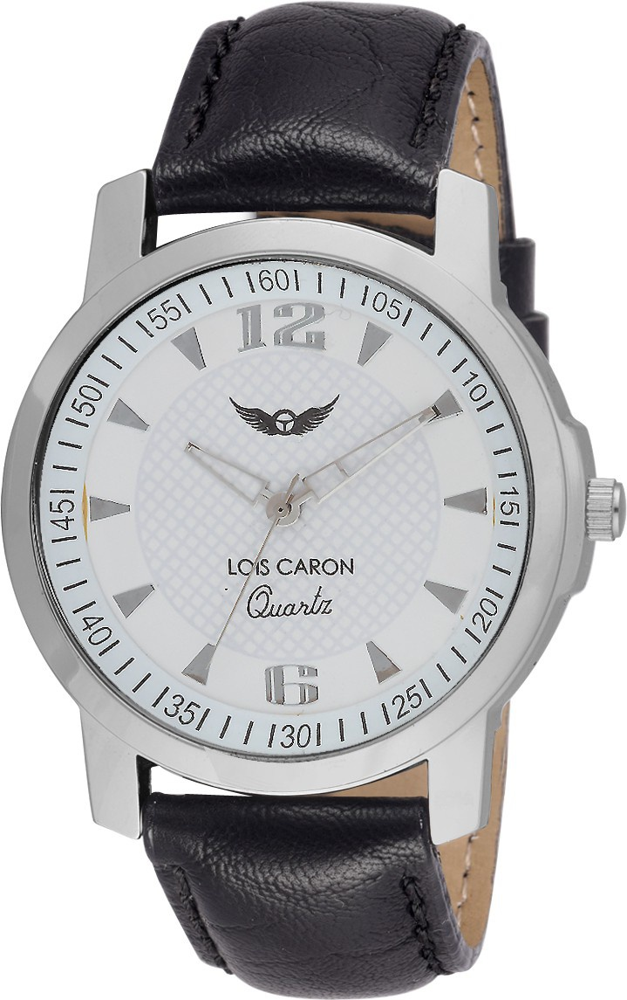

In [ ]:
Image('/content/drive/MyDrive/OC: Data Science/Datasets/Projet 6/Flipkart/Images/1e8741b5ae27a513546c94b3f3312aee.jpg', width=200)

## 4.3 Traitement des images

In [ ]:
from PIL import Image  as Image_PIL

In [ ]:
img_conv = Image_PIL.open('/content/drive/MyDrive/OC: Data Science/Datasets/Projet 6/Flipkart/Images/1e8741b5ae27a513546c94b3f3312aee.jpg')

In [ ]:
img_conv = np.array(img_conv)

In [ ]:
import cv2

In [ ]:
img_conv = cv2.resize(img_conv, (200,200))

In [ ]:
def filtre_moyenneur(img, voisinage = 1):
    '''Remplace chaque pixel par l\'intensité moyenne de son voisinage'''
    etendue = 1+2*voisinage
    img2 = np.copy(img)

    for i in range(0, img.shape[0]):
        for j in range(0, img.shape[1]):
            if (i<voisinage)|(i>img.shape[0] - voisinage-1):
                img2[i,j] = int(255/2)
            if (j<voisinage)|(j>img.shape[0] - voisinage-1):
                img2[i,j] = int(255/2)


    for i in range(voisinage,img.shape[0]-voisinage):
        for j in range(voisinage,img.shape[1]-voisinage):
            mean = 0
            for mean_x in range(i-voisinage, i+voisinage+1):
                for mean_y in range(j-voisinage, j+voisinage+1):
                    mean += img[mean_x, mean_y]
            img2[i,j] = mean/(etendue**2)


    return img2

In [ ]:
img_conv_traitee_1 = filtre_moyenneur(cv2.cvtColor(np.array(img_conv),cv2.COLOR_BGR2GRAY), voisinage=1)
img_conv_traitee_2 = filtre_moyenneur(cv2.cvtColor(np.array(img_conv),cv2.COLOR_BGR2GRAY), voisinage=2)
img_conv_traitee_3 = filtre_moyenneur(cv2.cvtColor(np.array(img_conv),cv2.COLOR_BGR2GRAY), voisinage=3)
img_conv_traitee_4 = filtre_moyenneur(cv2.cvtColor(np.array(img_conv),cv2.COLOR_BGR2GRAY), voisinage=4)

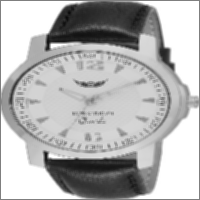

In [ ]:
Image_PIL.fromarray(img_conv_traitee_1)

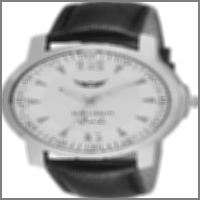

In [ ]:
Image_PIL.fromarray(img_conv_traitee_2)

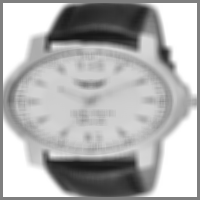

In [ ]:
Image_PIL.fromarray(img_conv_traitee_3)

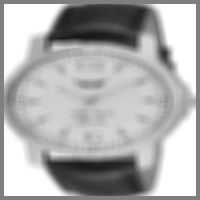

In [ ]:
Image_PIL.fromarray(img_conv_traitee_4)

**Réduction de bruit**

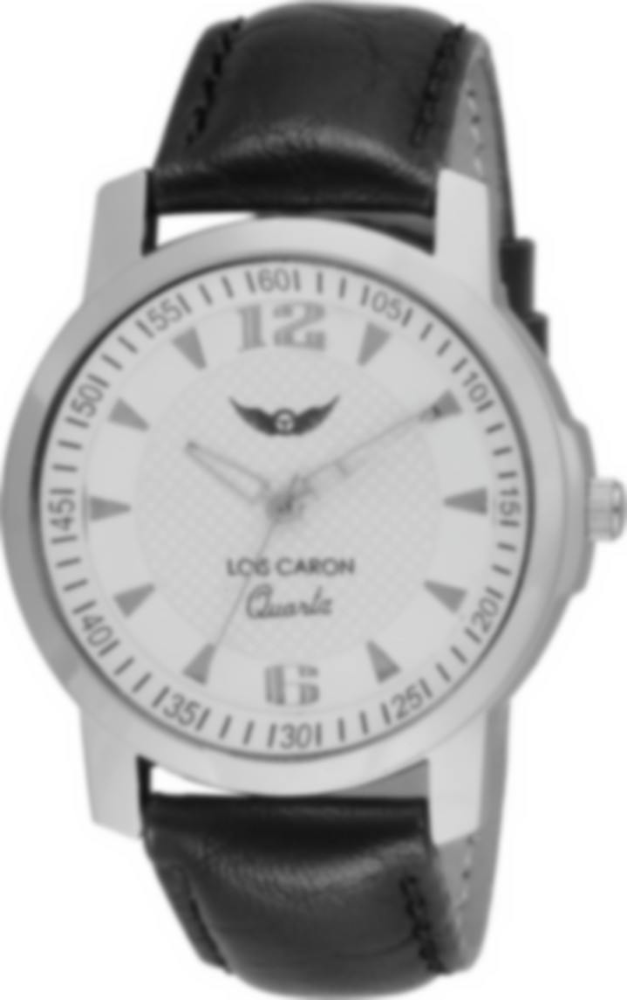

In [ ]:
from scipy.ndimage import gaussian_filter
im = np.array(Image_PIL.open('/content/drive/MyDrive/OC: Data Science/Datasets/Projet 6/Flipkart/Images/1e8741b5ae27a513546c94b3f3312aee.jpg'))
im = gaussian_filter(im, sigma=3)
Image_PIL.fromarray(im)

In [ ]:
hist, bins = np.histogram(im.flatten(), 256, [0,256])
cdf = hist.cumsum()
cdf_normalized = cdf * hist.max() / cdf.max()

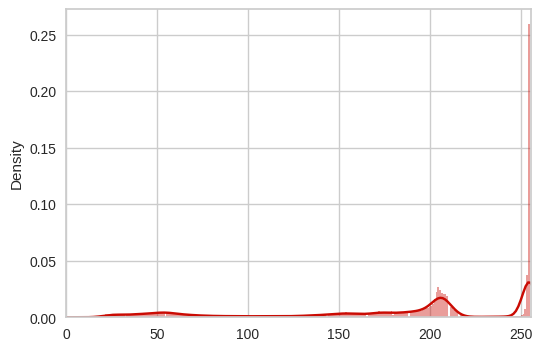

In [ ]:
plt.figure(figsize=(6,4))
sns.distplot(im.flatten(),256,[0,256], color = 'r')
plt.xlim([0,256])
plt.show()

In [ ]:
cdf_m = np.ma.masked_equal(cdf,0)
cdf_m = (cdf_m - cdf_m.min())*255/(cdf_m.max()-cdf_m.min())
cdf = np.ma.filled(cdf_m,0).astype('uint8')

In [ ]:
im2=cdf[im]

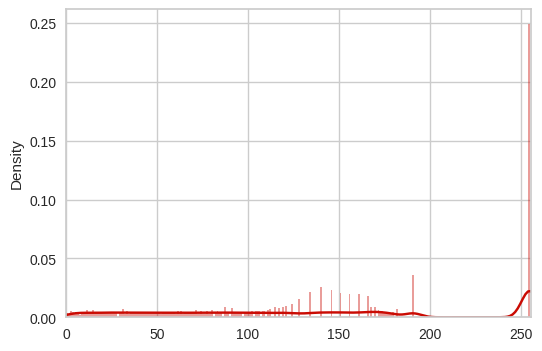

In [ ]:
plt.figure(figsize=(6,4))
sns.distplot(im2.flatten(),256,[0,256], color = 'r')
plt.xlim([0,256])
plt.show()

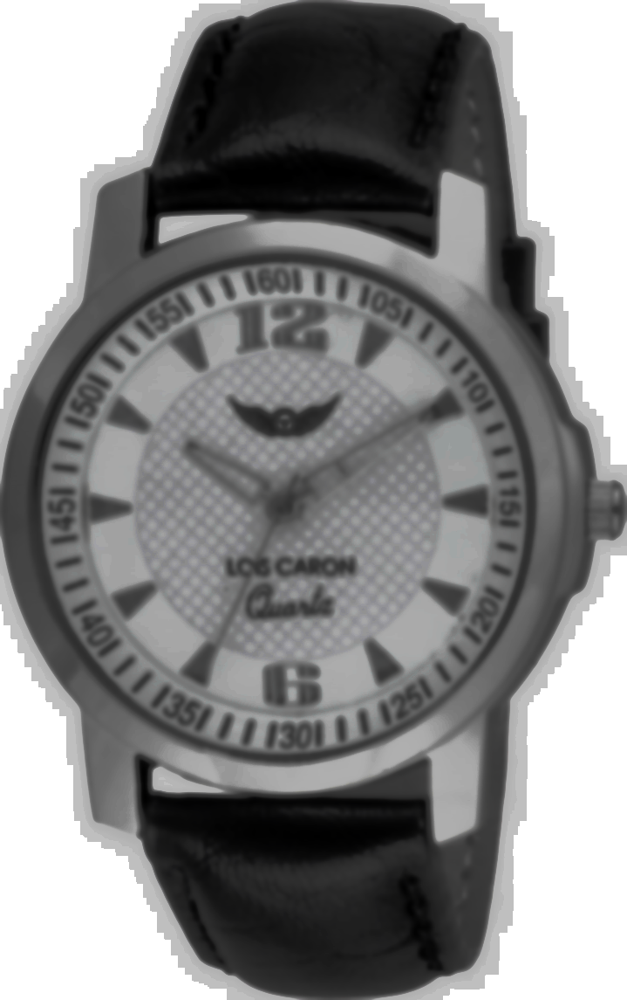

In [ ]:
Image_PIL.fromarray(im2)

In [ ]:
img3 = cv2.imread(img_echantillon.iloc[12]['image'],0)
equ = cv2.equalizeHist(img3)
res = np.hstack((img3,equ)) #stacking images side-by-side
cv2.imwrite('res.png',res)

True

In [ ]:
img3.shape

(1096, 1100)

In [ ]:
#redimensionnement
min_x = 100000
max_x = 0
min_y = 100000
max_y = 0
for image in img_echantillon['image'].tolist():
    shape = np.array(Image_PIL.open(image)).shape
    if shape[0] < min_x:
        min_x = shape[0]
    elif shape[0] > max_x:
        max_x = shape[0]
    if shape[1] < min_y:
        min_y = shape[1]
    elif shape[1] > max_y:
        max_y = shape[1]

In [ ]:
print('min_x {},\nmax_x {},\nmin_y {},\nmax_y {}'.format(min_x, max_x, min_y, max_y))

min_x 286,
max_x 4098,
min_y 302,
max_y 2800


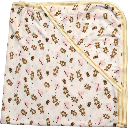

In [ ]:
resize_img = cv2.resize(np.array(Image_PIL.open(img_echantillon.iloc[12]['image'])), dsize=(128,128))
Image_PIL.fromarray(resize_img)

In [ ]:
def redim(array_im, width, height):
    '''Redimensionne l\'image correspondant à array_im dans la largeur et la hauteur définie'''
    min_x = 100000
    max_x = 0
    min_y = 100000
    max_y = 0
    shape = array_im.shape
    if shape[0] < min_x:
        min_x = shape[0]
    elif shape[0] > max_x:
        max_x = shape[0]
    if shape[1] < min_y:
        min_y = shape[1]
    elif shape[1] > max_y:
        max_y = shape[1]
    im = cv2.resize(array_im, dsize=(width,height))
    del shape
    return im

In [ ]:
def preprocess(image, path=False):
    '''prétraitement des images:
    * filtre gaussian
    * égalisation de l'histogramme
    * redimensionnement
    prend un entrée le chemin vers l'image et en sortie la matrice np.array de l'image traitée
    '''
    #ouverture du fichier
    if path == False: #si on a fourni un array en entree :
        im = image
    else: #si on a fourni un chemin vers le fichier en entree:
        im = np.array(Image_PIL.open(image))

    #greyscale
    im = cv2.cvtColor(im,cv2.COLOR_BGR2GRAY)

    #rotation
    im = cv2.rotate(img, cv2.ROTATE_180)

    #flou gaussien
    im = gaussian_filter(im, sigma=2)

    #égalisation
    im = cv2.equalizeHist(im)

    return redim(im, 128, 128)

## 4.4 Feature Extraction : SIFT

scale-invariant feature transform (SIFT) [texte du lien](https://fr.wikipedia.org/wiki/Scale-invariant_feature_transform#D%C3%A9tection_des_points-cl%C3%A9s_et_calcul_du_descripteur_SIFT) : est un algorithme utilisé dans le domaine de la vision par ordinateur pour détecter et identifier les éléments similaires entre différentes images numériques (éléments de paysages, objets, personnes, etc.)

In [ ]:
i = np.random.randint(img_echantillon.shape[0]-1)
img_sift = preprocess(img_echantillon.iloc[12]['image'], path=True)

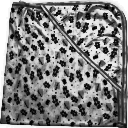

In [ ]:
Image_PIL.fromarray(img_sift)

Création  des descripteurs

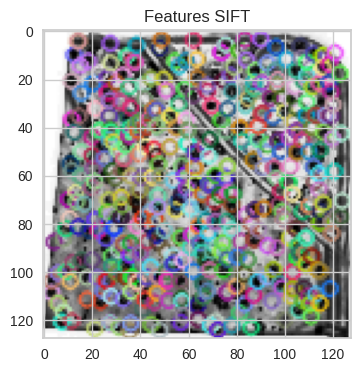

In [ ]:
sift = cv2.xfeatures2d.SIFT_create()
kp = sift.detect(img_sift,None)
img=cv2.drawKeypoints(img_sift,kp,img_sift)

plt.figure(figsize=(4,4))
plt.title('Features SIFT')
plt.imshow(img)

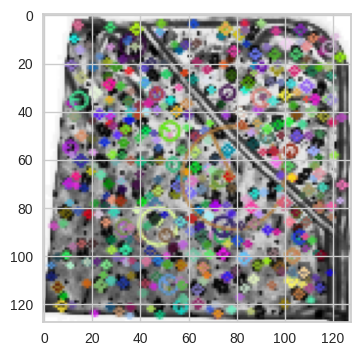

In [ ]:
img=cv2.drawKeypoints(img_sift,kp,img_sift,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
plt.figure(figsize=(4,4))
plt.imshow(img)

## 4.5 CNN(Convolutional Neural Network)

Les CNN désignent une sous-catégorie de réseaux de neurones et sont à ce jour un des modèles de classification d'images réputés être les plus performant. Leur mode de fonctionnement est à première vue simple : l'utilisateur fournit en entrée une image sous la forme d'une matrice de pixels

In [ ]:
def get_files(path_list):
    '''Renvoie la liste des matrices d\'images à partir d'une liste de chemins'''
    liste_image = []
    compteur = 0
    for image_path in path_list:
        #im = cv2.imread(image_path, 0)
        im = np.array(Image_PIL.open(image_path))
        liste_image.append(im)
        compteur +=1

    del compteur
    del im

    return liste_image

In [ ]:
def redim(array_im, width, height):
    '''Redimensionne l\'image correspondant à array_im dans la largeur et la hauteur définie'''
    min_x = 100000
    max_x = 0
    min_y = 100000
    max_y = 0
    shape = array_im.shape
    if shape[0] < min_x:
        min_x = shape[0]
    elif shape[0] > max_x:
        max_x = shape[0]
    if shape[1] < min_y:
        min_y = shape[1]
    elif shape[1] > max_y:
        max_y = shape[1]
    im = cv2.resize(array_im, dsize=(width,height))

    del shape

    return im

### Données

In [ ]:
train['image'] = train['image'].apply(lambda x: '/content/drive/MyDrive/OC: Data Science/Datasets/Projet 6/Flipkart/Images/'+str(x))
test['image'] = test['image'].apply(lambda x: '/content/drive/MyDrive/OC: Data Science/Datasets/Projet 6/Flipkart/Images/'+str(x))

In [ ]:
train_cnn = get_files(train.copy()['image'].tolist())
test_cnn = get_files(test.copy()['image'].tolist())

In [ ]:
len(train_cnn)

787

In [ ]:
len(test_cnn)

263

In [ ]:
redim(train_cnn[0], 128, 128).shape

(128, 128, 3)

In [ ]:
redim(train_cnn[0], 128, 128).reshape(1,-1,3).shape

(1, 16384, 3)

In [ ]:
train_array_cnn = np.vstack([redim(img, 128, 128).reshape(1,128,128,3) for img in train_cnn])
test_array_cnn = np.vstack([redim(img, 128, 128).reshape(1,128,128,3) for img in test_cnn])

In [ ]:
train_array_cnn.shape

(787, 128, 128, 3)

In [ ]:
from sklearn.preprocessing import OneHotEncoder
ohe = OneHotEncoder(handle_unknown='ignore')
array_cats = ohe.fit_transform(np.array(train['cat_niveau_1']).reshape(-1,1))

In [ ]:
array_cats.todense().shape

(787, 7)

In [ ]:
array_cats.shape

(787, 7)

In [ ]:
train_array_cats = ohe.transform(train[['cat_niveau_1']]).todense()
test_array_cats = ohe.transform(test[['cat_niveau_1']]).todense()

In [ ]:
ohe.categories_

[array(['Baby Care', 'Beauty and Personal Care', 'Computers',
        'Home Decor & Festive Needs', 'Home Furnishing',
        'Kitchen & Dining', 'Watches'], dtype=object)]

### Construction Réseau

In [ ]:
from keras.preprocessing.image import load_img, img_to_array
from keras.applications.vgg16 import preprocess_input

from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D
from keras.layers import Flatten, Dense, Activation

In [ ]:
model = Sequential()
model.add(Conv2D(32, kernel_size=(3,3), padding='same', activation='relu', input_shape=(128,128,3,)))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Conv2D(32, kernel_size=(3,3), padding='same', activation='relu'))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Flatten())
model.add(Dense(ohe.categories_[0].shape[0], activation='softmax'))
model.compile(loss='mean_squared_error', optimizer='sgd')

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 128, 128, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 64, 64, 32)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 64, 64, 32)        9248      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 32, 32, 32)        0         
 g2D)                                                            
                                                                 
 flatten (Flatten)           (None, 32768)             0         
                                                                 
 dense (Dense)               (None, 7)                 2

### Entraînement

In [ ]:
train_array_cnn.shape

(787, 128, 128, 3)

In [ ]:
model_info = model.fit(train_array_cnn, train_array_cats, epochs=3, batch_size=40, verbose=2)

Epoch 1/3
20/20 - 17s - loss: 0.2439 - 17s/epoch - 842ms/step
Epoch 2/3
20/20 - 16s - loss: 0.2476 - 16s/epoch - 825ms/step
Epoch 3/3
20/20 - 17s - loss: 0.2476 - 17s/epoch - 827ms/step


In [ ]:
for couche in model.get_weights():
    print(couche.shape)

(3, 3, 3, 32)
(32,)
(3, 3, 32, 32)
(32,)
(32768, 7)
(7,)


In [ ]:
predictions_test = model.predict(test_array_cnn)

9/9 [==============================] - 2s 194ms/step


In [ ]:
predictions_test.shape

(263, 7)

In [ ]:
from sklearn.metrics import accuracy_score
print("\033[1;34;41mAccurancy score")
accuracy_score(np.asarray(predictions_test).round(2).reshape(-1,1),np.asarray(test_array_cats).round(2).reshape(-1,1) )

Accurancy score


0.7631721890277023

In [ ]:
np.argmax(test_array_cats, axis=1).reshape(1,-1)

matrix([[2, 5, 2, 1, 6, 0, 3, 2, 4, 4, 6, 0, 5, 1, 2, 2, 0, 2, 4, 4, 5,
         2, 0, 2, 6, 1, 3, 5, 1, 5, 5, 2, 2, 6, 3, 4, 6, 3, 3, 2, 4, 1,
         5, 4, 1, 5, 5, 2, 0, 4, 5, 3, 5, 4, 2, 0, 1, 5, 2, 4, 4, 0, 6,
         5, 6, 4, 0, 3, 4, 6, 0, 2, 2, 2, 6, 2, 4, 3, 2, 4, 4, 4, 2, 5,
         2, 6, 4, 3, 3, 3, 4, 4, 5, 3, 6, 2, 0, 6, 3, 0, 4, 6, 3, 4, 2,
         6, 1, 5, 4, 2, 5, 4, 4, 0, 0, 0, 2, 6, 6, 2, 2, 2, 3, 4, 5, 3,
         1, 3, 0, 0, 5, 1, 0, 3, 0, 5, 3, 1, 5, 2, 5, 0, 3, 4, 4, 6, 6,
         1, 3, 1, 6, 1, 6, 3, 2, 4, 6, 1, 3, 6, 6, 6, 0, 2, 3, 6, 6, 2,
         6, 2, 6, 1, 4, 6, 0, 6, 3, 3, 4, 3, 0, 5, 4, 3, 0, 1, 0, 6, 2,
         4, 1, 6, 5, 4, 5, 2, 1, 5, 2, 2, 1, 0, 4, 2, 1, 3, 6, 0, 0, 3,
         6, 3, 2, 2, 4, 1, 0, 4, 3, 3, 4, 0, 1, 4, 2, 3, 4, 0, 2, 1, 2,
         2, 1, 2, 5, 4, 0, 6, 1, 4, 4, 4, 4, 0, 3, 2, 3, 3, 0, 5, 0, 6,
         5, 0, 5, 0, 5, 3, 1, 0, 0, 6, 6]])

In [ ]:
ohe.categories_[0][5]

'Kitchen & Dining'

In [ ]:
ohe.categories_[0][1]

'Beauty and Personal Care'

In [ ]:
ohe.categories_[0][6]

'Watches'

### Classification non supervisée

In [ ]:
from keras.models import clone_model

On retire les 2 dernières couches du réseau de neurone pour accéder aux features

In [ ]:
unsupervised_model= clone_model(model)
unsupervised_model.layers.pop()
unsupervised_model.layers.pop()
unsupervised_model.compile(loss='mean_squared_error', optimizer='sgd')


In [ ]:
unsupervised_array = unsupervised_model.predict(train_array_cnn)

25/25 [==============================] - 7s 277ms/step


In [ ]:
unsupervised_array.shape

(787, 7)

In [ ]:
from ipywidgets import IntProgress
from ipywidgets import Text
from IPython.display import display
import time
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN

In [ ]:
dict_kmeans = {}
inertia = {}
max_clusters=50

f = IntProgress(min=1, max=max_clusters) # instantiate the bar
chaine = str(1)+'/'+str(max_clusters)
g = Text(value=chaine)
display(f) # display the bar
display(g)

for k in range(1,max_clusters):
    kmeans = KMeans(n_clusters=k,
                   verbose=1,
                   random_state=0).fit(unsupervised_array)
    inertia[k] = kmeans.inertia_
    dict_kmeans[k] = kmeans
    f.value = k # signal to increment the progress bar
    g.value =str(k)+'/'+str(max_clusters)

IntProgress(value=1, max=50, min=1)

Text(value='1/50')

Initialization complete
Iteration 0, inertia 464.54510498046875.
Iteration 1, inertia 333.0240783691406.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 1133.459228515625.
Iteration 1, inertia 333.0240783691406.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 464.54510498046875.
Iteration 1, inertia 333.0240783691406.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 1061.668212890625.
Iteration 1, inertia 333.0240783691406.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 464.54510498046875.
Iteration 1, inertia 333.0240783691406.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 464.54510498046875.
Iteration 1, inertia 333.0240783691406.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 380.8779296875.
Iteration 1, inertia 333.0240783691

In [ ]:
from sklearn.metrics import silhouette_score

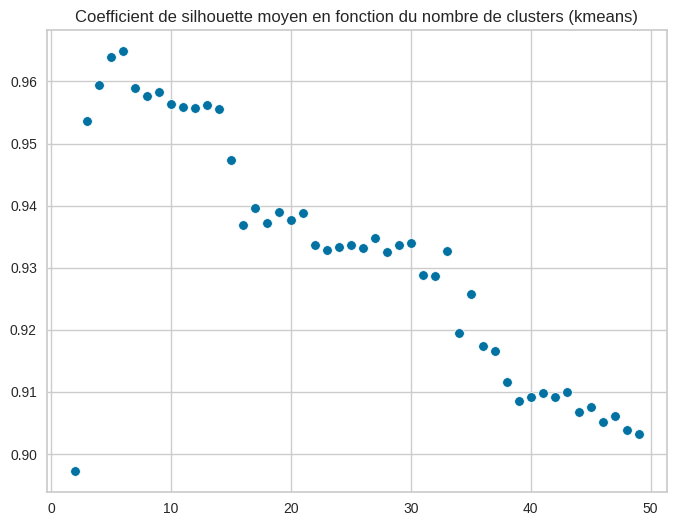

In [ ]:
silhouettes_kmeans = {}
for i in range(2,max_clusters):
    silhouettes_kmeans[i] = silhouette_score(X = unsupervised_array,
                                             labels= list(dict_kmeans[i].labels_))

plt.figure(figsize=(8,6)),
plt.title('Coefficient de silhouette moyen en fonction du nombre de clusters (kmeans)')
sns.scatterplot(x = list(silhouettes_kmeans.keys()),
               y = list(silhouettes_kmeans.values()))
plt.show()



In [ ]:
for key, value in silhouettes_kmeans.items():
    if value == max(silhouettes_kmeans.values()):
        print('le coefficient de silhouette est maximal pour {} clusters (score = {})'.format(key, value))
        nb_clusters_optimal = key

le coefficient de silhouette est maximal pour 6 clusters (score = 0.9648595452308655)


Nombre d'éléments par catégorie

In [ ]:
pd.DataFrame(dict_kmeans[8].labels_)[0].value_counts()

0    533
1    193
2     26
3     15
6      9
7      8
4      2
5      1
Name: 0, dtype: int64

In [ ]:
train_labelized = train.copy()
train_labelized['label_kmeans'] = dict_kmeans[nb_clusters_optimal].labels_

In [ ]:
train_labelized.groupby(['label_kmeans']).apply(lambda x: (x.groupby('cat_niveau_1')
                                      .count()
                                      .sort_values('cat_niveau_1', ascending=False))
                                     )['uniq_id']

label_kmeans  cat_niveau_1              
0             Watches                       78
              Kitchen & Dining              96
              Home Furnishing               66
              Home Decor & Festive Needs    77
              Computers                     67
              Beauty and Personal Care      81
              Baby Care                     70
1             Watches                       25
              Kitchen & Dining              18
              Home Furnishing               33
              Home Decor & Festive Needs    28
              Computers                     25
              Beauty and Personal Care      41
              Baby Care                     31
2             Watches                        8
              Kitchen & Dining               1
              Home Furnishing                3
              Home Decor & Festive Needs     4
              Computers                      8
              Baby Care                      2
3             Kitch

In [ ]:
pd.DataFrame(train, )

,uniq_id,crawl_timestamp,product_url,product_name,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications,cat_niveau_1,cat_niveau_2,cat_niveau_3,Cluster_cat,cleaned_description,lemmatizer,tokenized,stemmer,tokenize_stem
165,785b4383b12106dd172306d427d8f7b2,2015-12-01 12:40:44,http://www.flipkart.com/rockmantra-cute-two-cats-ceramic-mug/p/itmeaggkyugvunnv?pid=MUGEAGGKFBTYPN4Z,Rockmantra Cute Two Cats Ceramic Mug,MUGEAGGKFBTYPN4Z,499.0,349.0,/content/drive/MyDrive/OC: Data Science/Datasets/Projet 6/Flipkart/Images/785b4383b12106dd172306d427d8f7b2.jpg,False,"Rockmantra Cute Two Cats Ceramic Mug (5.5 l)\r\n Price: Rs. 349\r\n\t\t\t\t\r\n\t\t\tGive a thrilling yet fresh start to your day. An exclusive creation by Rockmantra, this mug features porcelain crafting ensuring the design stays permanent for years to come and making it...",No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Type"", ""value""=>""Mug""}, {""key""=>""Mug Capacity"", ""value""=>""5.5 l""}, {""key""=>""Freezer Safe"", ""value""=>""Yes""}, {""key""=>""Material"", ""value""=>""Ceramic""}, {""key""=>""Microwave Safe"", ""value""=>""Yes""}, {""value""=>""1 Year Rockmantra Brand Warranty and Free Transit Insuran...",Kitchen & Dining,Coffee Mugs,Rockmantra Coffee Mugs,4,rockmantra cute two cats ceramic mug 55 l\r\n price rs 349\r\n\t\t\t\t\r\n\t\t\tgive a thrilling yet fresh start to your day an exclusive creation by rockmantra this mug features porcelain crafting ensuring the design stays permanent for years to come and making it a perf...,rockmantra cute two cat ceramic mug price give thrill yet fresh start day exclusive creation rockmantra mug feature porcelain craft ensure design stay permanent year come make perfect pick gift love one toodishwasher microwave safe product detail specification material ceramic size give thrill y...,"[rockmantra, cute, two, cat, ceramic, mug, price, give, thrill, yet, fresh, start, day, exclusive, creation, rockmantra, mug, feature, porcelain, craft, ensure, design, stay, permanent, year, come, make, perfect, pick, gift, love, one, toodishwasher, microwave, safe, product, detail, specificati...",rockmantra cute two cat ceram mug price give thrill yet fresh start day exclus creation rockmantra mug featur porcelain craft ensur design stay perman year come make perfect pick gift love one dishwash microwav safe product detail specif materi ceram size give thrill yet fresh start day exclus c...,"[rockmantra, cute, two, cat, ceram, mug, price, give, thrill, yet, fresh, start, day, exclus, creation, rockmantra, mug, featur, porcelain, craft, ensur, design, stay, perman, year, come, make, perfect, pick, gift, love, one, dishwash, microwav, safe, product, detail, specif, materi, ceram, size..."
248,45d0af2c709de47268c80c35a117de44,2015-12-01 12:40:44,http://www.flipkart.com/malhar-niko-male-doll-showpiece-25-cm/p/itmey382drsj8cbj?pid=SHIEY382SR75SXEY,Malhar Niko Male Doll Showpiece - 25 cm,SHIEY382SR75SXEY,6395.0,5436.0,/content/drive/MyDrive/OC: Data Science/Datasets/Projet 6/Flipkart/Images/45d0af2c709de47268c80c35a117de44.jpg,True,Buy Malhar Niko Male Doll Showpiece - 25 cm for Rs.5436 online. Malhar Niko Male Doll Showpiece - 25 cm at best prices with FREE shipping & cash on delivery. Only Genuine Products. 30 Day Replacement Guarantee.,No rating available,No rating available,Malhar,"{""product_specification""=>[{""key""=>""Brand"", ""value""=>""Malhar""}, {""key""=>""Model Number"", ""value""=>""A039""}, {""key""=>""Type"", ""value""=>""Ethnic""}, {""key""=>""Material"", ""value""=>""Iron""}, {""key""=>""Model Name"", ""value""=>""Niko Male Doll""}, {""key""=>""Purpose"", ""value""=>""Show Piece""}, {""key""=>""Color"", ""value...",Home Decor & Festive Needs,Showpieces,Malhar Showpieces,3,buy malhar niko male doll showpiece 25 cm for rs5436 online malhar niko male doll showpiece 25 cm at best prices with free shipping cash o

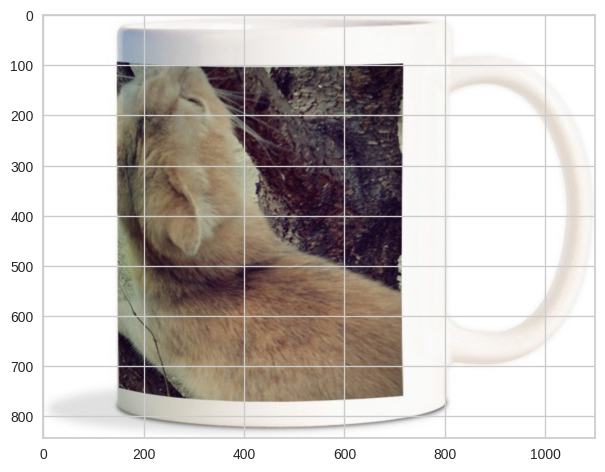

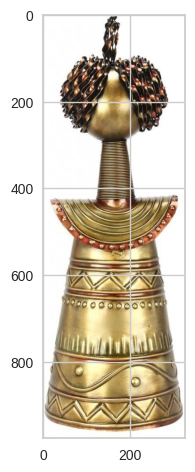

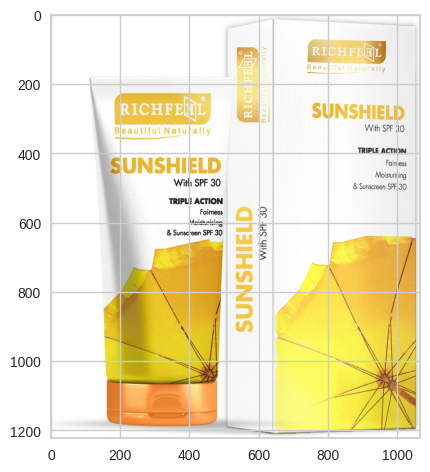

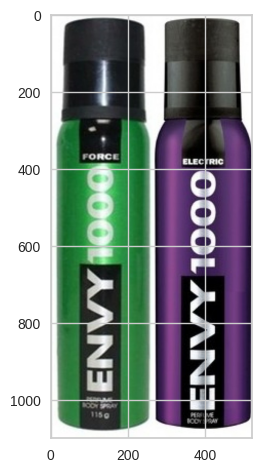

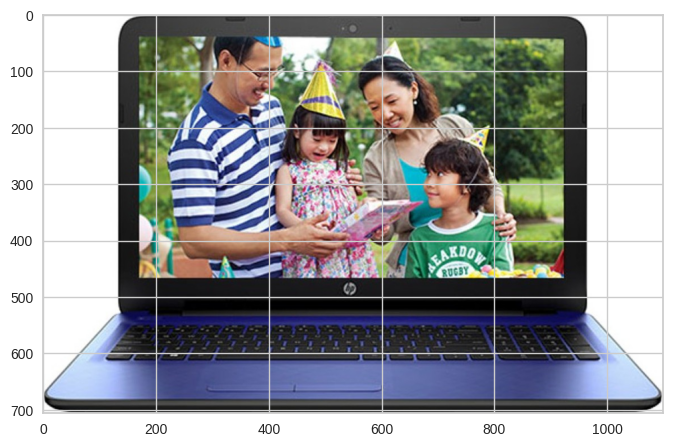

...

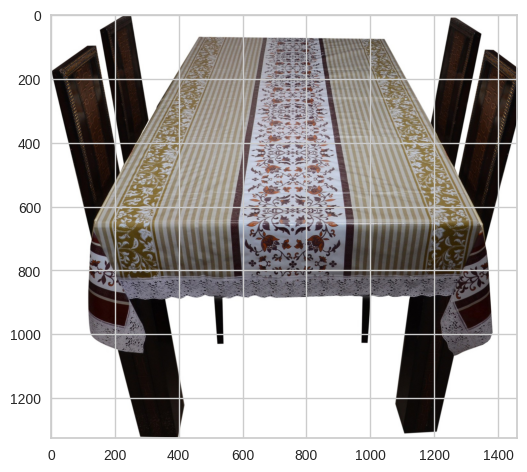

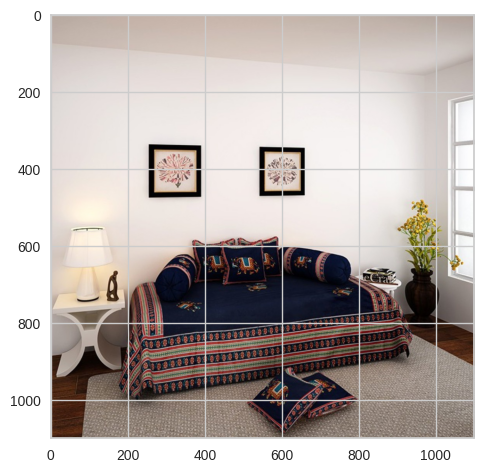

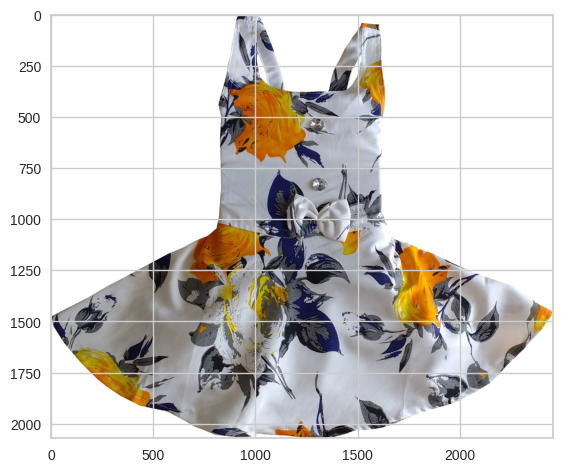

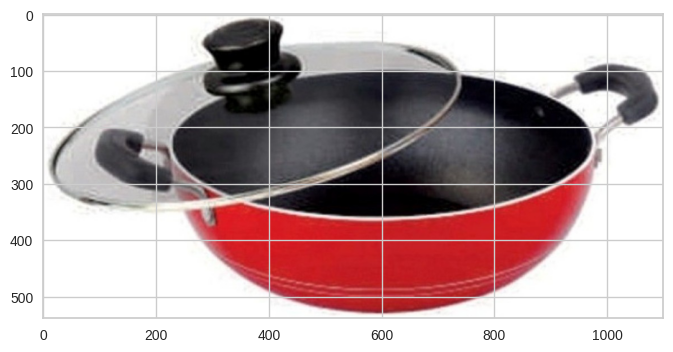

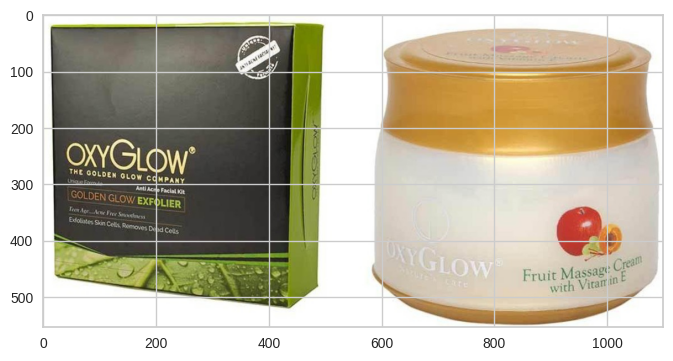

In [ ]:
%matplotlib inline
k = 0
for image in train_labelized[train_labelized['label_kmeans'] == 0]['image'].tolist():
    if k < 20:
        chemin = image
        plt.figure()
        plt.imshow(Image_PIL.open(chemin))
        plt.show()
        k+=1
    else:
        break

##  4.6 Etude de faisabilité

### Création du modèle pré-entraîné

Nous avons deja traite nos images grace aux CNN.
Pour voir si on peut classifier nos images nous allons utiliser VGG16 comme modele de keras.

VGG16 est un modèle de réseau de neurones à convolution conçu par K. Simonyan et A. Zisserman. On retrouve les détails d’implémentation dans le document «Very Deep Convolutional Networks for Large-Scale Image Recognition». Ce modèle atteint une précision de test de 92,7% dans ImageNet, qui qui regroupe plus de 14 millions d’images appartenant à 1000 classes. Pourquoi vgg-16 et bien tout simplement parceque ce réseau de neurones comprend 16 couches profondes :
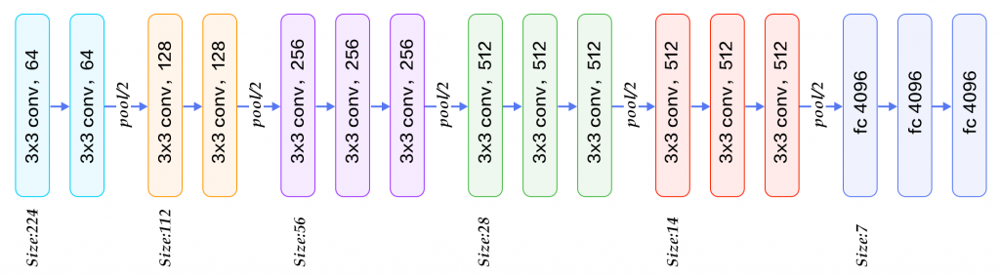


In [ ]:
from keras.applications.vgg16 import VGG16
from tensorflow.keras.models import Model, Sequential

In [ ]:
base_model = VGG16()
model = Model(inputs=base_model.inputs, outputs=base_model.layers[-2].output)

print(model.summary())

553467096/553467096 [==============================] - 5s 0us/step
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                            

### Création des features des images

In [ ]:
images_features = []
i=0
for image_file in data["image"] :
    if i%100 == 0 : print(i)
    i +=1
    image = load_img('/content/drive/MyDrive/OC: Data Science/Datasets/Projet 6/Flipkart/Images/'+image_file, target_size=(224, 224))
    image = img_to_array(image)
    image = np.expand_dims(image, axis=0)
    image = preprocess_input(image)
    images_features.append(model.predict(image, verbose=0)[0]) # predict from pretrained model

images_features = np.asarray(images_features)


0
100
200
300
400
500
600
700
800
900
1000


In [ ]:
images_features.shape

(1050, 4096)

### Réduction dimension et analyse

### Réduction de dimension PCA

In [ ]:
from sklearn import manifold, decomposition

print(images_features.shape)
pca = decomposition.PCA(n_components=0.99)
feat_pca= pca.fit_transform(images_features)
print(feat_pca.shape)

(1050, 4096)
(1050, 803)


### Réduction de dimension T-SNE et affichage des images selon vraies classes

In [ ]:
from sklearn import manifold, decomposition
import time

temps1 = time.time()

tsne = manifold.TSNE(n_components=2, perplexity=30, n_iter=2000, init='random', random_state=6)
X_tsne = tsne.fit_transform(feat_pca)

duration1=time.time()-temps1
print("temps de T-SNE : ", "%15.2f" % duration1, "secondes")

temps de T-SNE :            25.87 secondes


In [ ]:
data.columns

Index(['uniq_id', 'crawl_timestamp', 'product_url', 'product_name', 'pid',
       'retail_price', 'discounted_price', 'image', 'is_FK_Advantage_product',
       'description', 'product_rating', 'overall_rating', 'brand',
       'product_specifications', 'cat_niveau_1', 'cat_niveau_2',
       'cat_niveau_3', 'Cluster_cat', 'cleaned_description', 'lemmatizer',
       'tokenized', 'stemmer', 'tokenize_stem'],
      dtype='object')

In [ ]:
labels =  data.Cluster_cat

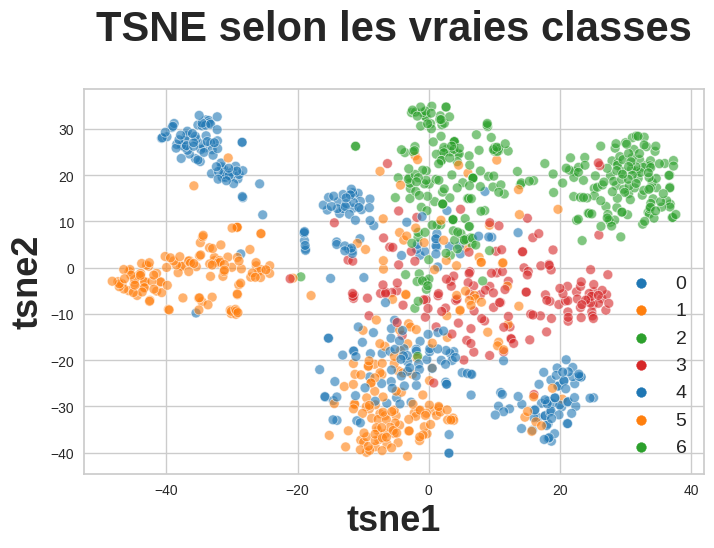

In [ ]:
df_tsne = pd.DataFrame(X_tsne, columns=['tsne1', 'tsne2'])
df_tsne["class"] = labels

plt.figure(figsize=(8,5))
sns.scatterplot(
    x="tsne1", y="tsne2",
    hue="class",
    palette=sns.color_palette('tab10', n_colors=4), s=50, alpha=0.6,
    data=df_tsne,
    legend="brief")

plt.title('TSNE selon les vraies classes', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(prop={'size': 14})

plt.show()


* L'analyse graphique montre visuellement qu'il est réalisable de séparer automatiquement les images selon leurs vraies classes
* Ceci suffit à démontrer la faisabilité de réaliser ultérieurement une classification supervisée pour déterminer automatiquement les classes des images


### Création de clusters à partir du T-SNE et affichage des images selon clusters
* Attention : ici, il ne s'agit pas de faire une classification non supervisée, mais simplement, par une mesure de l'ARI, de conforter l'analyse graphique précédente qui démontre la faisabilité de réaliser ultérieurement une classification supervisée. Cette mesure de l'ARI nécessite de créer des clusters théoriques via KMeans
* Il s'agit donc de réaliser une mesure de ce que nous voyons graphiquement, donc à partir des données en sortie du t-sne
* Pour réaliser une classification non supervisée, il aurait fallu repartir des données avant t-sne
* Dans la démarche en 2 étapes, il n'est pas utile de réaliser une classification non supervisée, une classification supervisée est bien plus performante. Même le calcul de l'ARI n'est pas indispensable, nous pourrions passer directement du graphique t-sne précédent à l'étape 2 de classification supervisée
* Il n'est donc pas utile de passer du temps à optimiser l'ARI, un ordre de grandeur suffit pour conforter le 1er graphique t-sne. D'ailleurs la meilleure solution de feature engineering ne génère pas toujours le meilleur ARI. L'analyse graphique t-sne est bien plus riche d'enseignement


In [ ]:
from sklearn import cluster, metrics

cls = cluster.KMeans(n_clusters=7, n_init=100)
cls.fit(X_tsne)

KMeans(n_clusters=7, n_init=100)

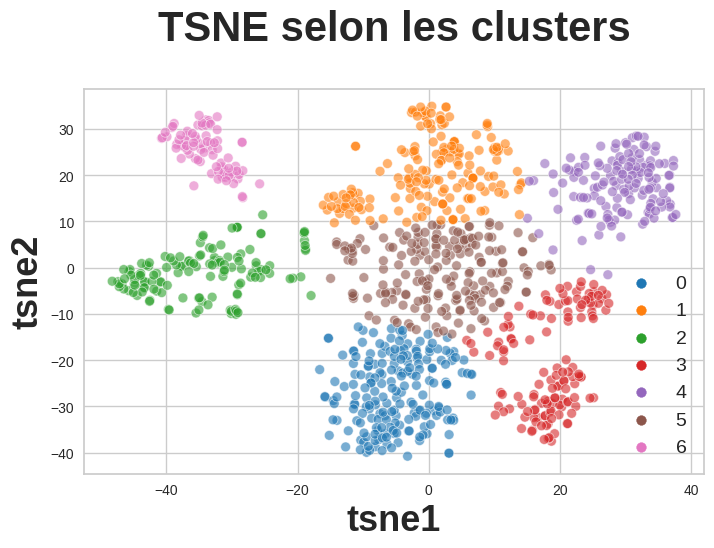

ARI :  0.45209807534416524


In [ ]:
df_tsne["cluster"] = cls.labels_

plt.figure(figsize=(8,5))
sns.scatterplot(
    x="tsne1", y="tsne2",
    hue="cluster",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.6,
    data=df_tsne,
    legend="brief")

plt.title('TSNE selon les clusters', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(prop={'size': 14})

plt.show()

print("ARI : ", metrics.adjusted_rand_score(labels, cls.labels_))

In [ ]:
# Analyse d'image "Baby Care" affectées au cluster 3

list_Baby_Care_0 = [i for i in range(len(data["image"])) \
                if (data.iloc[i]['cat_niveau_1']=='Baby Care') and (df_tsne.iloc[i]['cluster']==3)]
list_Baby_Care_0[1]

904

In [ ]:
from skimage.io import imread

tsne1      2.742963
tsne2     -10.38763
class             1
cluster           5
Name: 220, dtype: object


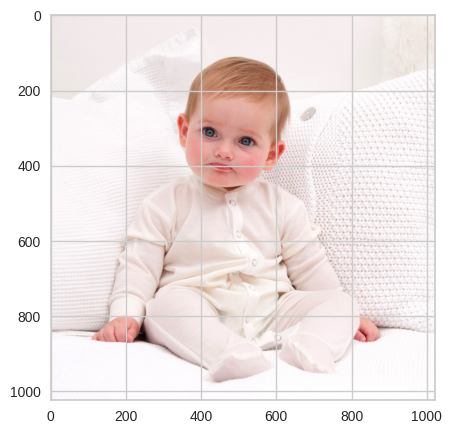

In [ ]:
# Affichage image 'baby care''
id = 220
print(df_tsne.iloc[id])
fig = plt.figure(figsize = (8, 5))
# plt.subplot(130 + 1 + i)
filename = data["image"][id]
image = imread('/content/drive/MyDrive/OC: Data Science/Datasets/Projet 6/Flipkart/Images/'+filename)
plt.imshow(image)
plt.show()

tsne1     -2.674859
tsne2      3.515375
class             3
cluster           5
Name: 250, dtype: object


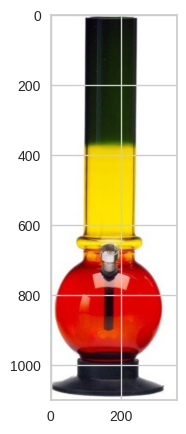

In [ ]:
# Affichage image 'baby care'
id = 250
print(df_tsne.iloc[id])
fig = plt.figure(figsize = (8, 5))
# plt.subplot(130 + 1 + i)
filename = data["image"][id]
image = imread('/content/drive/MyDrive/OC: Data Science/Datasets/Projet 6/Flipkart/Images/'+filename)
plt.imshow(image)
plt.show()

tsne1      -5.161387
tsne2     -17.648096
class              0
cluster            0
Name: 890, dtype: object


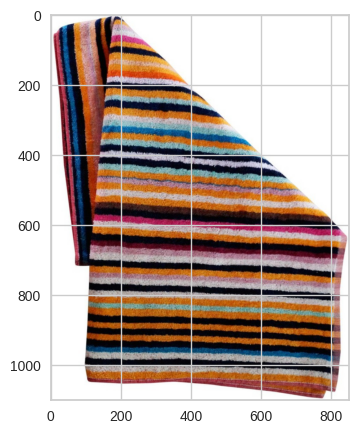

In [ ]:
# Affichage image
id = 890
print(df_tsne.iloc[id])
fig = plt.figure(figsize = (8, 5))
# plt.subplot(130 + 1 + i)
filename = data["image"][id]
image = imread('/content/drive/MyDrive/OC: Data Science/Datasets/Projet 6/Flipkart/Images/'+filename)
plt.imshow(image)
plt.show()

### Analyse par classes

In [ ]:
conf_mat = metrics.confusion_matrix(labels.astype(str), cls.labels_.astype(str),)

print(conf_mat)

[[ 79   0   0  66   0   5   0]
 [109   2   3   9   0  26   1]
 [  0  13   0   0 135   2   0]
 [  3   5   1  55   8  78   0]
 [  0  32  10   0   0  30  78]
 [  5   9 117   5   1  12   1]
 [  1 113   1   0   1  34   0]]


<Axes: >

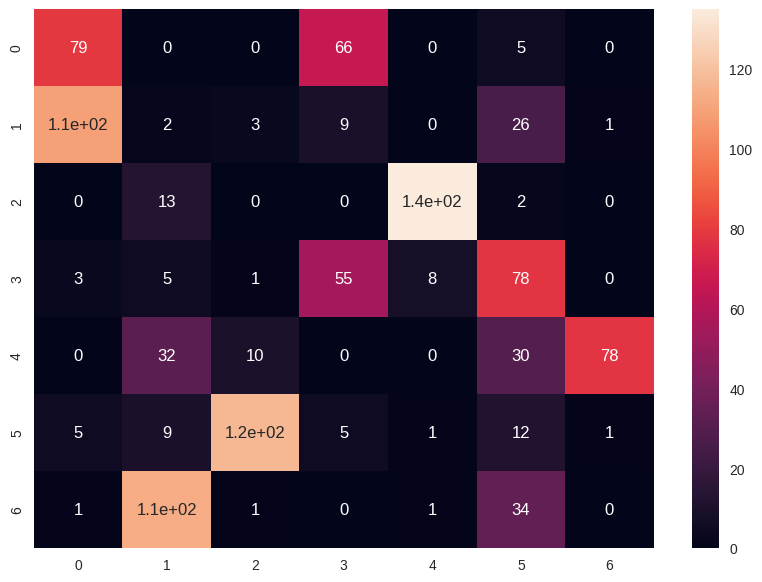

In [ ]:
import seaborn as sn
import pandas as pd
import matplotlib.pyplot as plt


plt.figure(figsize = (10,7))
sn.heatmap(conf_mat, annot=True)

In [ ]:
print(metrics.classification_report(labels.astype(str), cls.labels_.astype(str)))

              precision    recall  f1-score   support

           0       0.40      0.53      0.46       150
           1       0.01      0.01      0.01       150
           2       0.00      0.00      0.00       150
           3       0.41      0.37      0.39       150
           4       0.00      0.00      0.00       150
           5       0.06      0.08      0.07       150
           6       0.00      0.00      0.00       150

    accuracy                           0.14      1050
   macro avg       0.13      0.14      0.13      1050
weighted avg       0.13      0.14      0.13      1050



In [ ]:
data.shape

(1050, 23)

In [ ]:
data.columns

Index(['uniq_id', 'crawl_timestamp', 'product_url', 'product_name', 'pid',
       'retail_price', 'discounted_price', 'image', 'is_FK_Advantage_product',
       'description', 'product_rating', 'overall_rating', 'brand',
       'product_specifications', 'cat_niveau_1', 'cat_niveau_2',
       'cat_niveau_3', 'Cluster_cat', 'cleaned_description', 'lemmatizer',
       'tokenized', 'stemmer', 'tokenize_stem'],
      dtype='object')

In [ ]:
train.shape

(787, 23)

In [ ]:
train.columns

Index(['uniq_id', 'crawl_timestamp', 'product_url', 'product_name', 'pid',
       'retail_price', 'discounted_price', 'image', 'is_FK_Advantage_product',
       'description', 'product_rating', 'overall_rating', 'brand',
       'product_specifications', 'cat_niveau_1', 'cat_niveau_2',
       'cat_niveau_3', 'Cluster_cat', 'cleaned_description', 'lemmatizer',
       'tokenized', 'stemmer', 'tokenize_stem'],
      dtype='object')

Apres cette etude de faisabilité nous voyons que nous pouvons classer nos images dans 7 clusters (catégories). notre graphe TSNE le confirme.

Dans le notebook2 nous continuons avec la feature extractuion du texte et la classification des images.

In [ ]:
data.to_csv(path + 'data_cleaned.csv', index = False)